## **api_to_csv**

In [1]:
import requests
import pandas as pd

In [2]:
api_key = "716a536977677533323169794d6e42"
api_key

'716a536977677533323169794d6e42'

In [3]:
res = requests.get(f'http://openapi.seoul.go.kr:8088/{api_key}/json/bikeList/1/1000/')
res

<Response [200]>

In [6]:
json = res.json()
json.keys()

dict_keys(['rentBikeStatus'])

In [8]:
json['rentBikeStatus']['row'][:3]

[{'rackTotCnt': '15',
  'stationName': '102. 망원역 1번출구 앞',
  'parkingBikeTotCnt': '13',
  'shared': '87',
  'stationLatitude': '37.55564880',
  'stationLongitude': '126.91062927',
  'stationId': 'ST-4'},
 {'rackTotCnt': '14',
  'stationName': '103. 망원역 2번출구 앞',
  'parkingBikeTotCnt': '24',
  'shared': '171',
  'stationLatitude': '37.55495071',
  'stationLongitude': '126.91083527',
  'stationId': 'ST-5'},
 {'rackTotCnt': '13',
  'stationName': '104. 합정역 1번출구 앞',
  'parkingBikeTotCnt': '5',
  'shared': '38',
  'stationLatitude': '37.55073929',
  'stationLongitude': '126.91508484',
  'stationId': 'ST-6'}]

In [9]:
# OpenAPI 데이터 가져오기
rows = []
count = 0
while True:
    res = requests.get(f'http://openapi.seoul.go.kr:8088/{api_key}/json/bikeList/{count+1}/{count+1000}/')
    json = res.json()
    if 'rentBikeStatus' in json.keys():
        row = json['rentBikeStatus']['row']
        rows.extend(row)
        count += 1000
    else:
        break

In [10]:
len(rows)

2699

In [15]:
pd.DataFrame(rows).to_csv('./station_data.csv')

## **EDA**

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

plt.rc('font', family='Malgun Gothic')

In [4]:
station_df = pd.read_csv('./station_data.csv', index_col=0)
station_df.head()

,rackTotCnt,stationName,parkingBikeTotCnt,shared,stationLatitude,stationLongitude,stationId
0,15,102. 망원역 1번출구 앞,13,87,37.555649,126.910629,ST-4
1,14,103. 망원역 2번출구 앞,24,171,37.554951,126.910835,ST-5
2,13,104. 합정역 1번출구 앞,5,38,37.550739,126.915085,ST-6
3,5,105. 합정역 5번출구 앞,0,0,37.550007,126.914825,ST-7
4,12,106. 합정역 7번출구 앞,10,83,37.548645,126.912827,ST-8


In [5]:
station_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2699 entries, 0 to 2698
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   rackTotCnt         2699 non-null   int64  
 1   stationName        2699 non-null   object 
 2   parkingBikeTotCnt  2699 non-null   int64  
 3   shared             2699 non-null   int64  
 4   stationLatitude    2699 non-null   float64
 5   stationLongitude   2699 non-null   float64
 6   stationId          2699 non-null   object 
dtypes: float64(2), int64(3), object(2)
memory usage: 168.7+ KB


In [6]:
break_df = pd.read_csv('./서울시 공공자전거 고장신고 내역_23.1-6.csv', encoding='cp949')
break_df.head()

,자전거번호,등록일시,구분
0,SPB-62819,2023-01-01 0:01,안장
1,SPB-62819,2023-01-01 0:01,페달
2,SPB-32382,2023-01-01 0:24,타이어
3,SPB-81126,2023-01-01 1:20,단말기
4,SPB-45763,2023-01-01 1:49,체인


In [7]:
break_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83734 entries, 0 to 83733
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   자전거번호   83734 non-null  object
 1   등록일시    83734 non-null  object
 2   구분      83734 non-null  object
dtypes: object(3)
memory usage: 1.9+ MB


In [8]:
office_df = pd.read_csv('./서울특별시 공공자전거 대여소별 이용정보(월별)_23.1-6.csv', encoding='cp949')
office_df.head()

,자치구,대여소명,기준년월,대여건수,반납건수
0,강남구,2301. 현대고등학교 건너편,202301,383,439
1,강남구,2302. 교보타워 버스정류장(신논현역 3번출구 후면),202301,433,446
2,강남구,2303. 논현역 10번출구,202301,648,508
3,강남구,2304. 대현그린타워,202301,76,55
4,강남구,2305. MCM 본사 직영점 앞,202301,172,179


In [9]:
office_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16306 entries, 0 to 16305
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   자치구     16306 non-null  object
 1   대여소명    16306 non-null  object
 2   기준년월    16306 non-null  int64 
 3   대여건수    16306 non-null  object
 4   반납건수    16306 non-null  object
dtypes: int64(1), object(4)
memory usage: 637.1+ KB


In [10]:
history_df = pd.read_csv('./서울특별시 공공자전거 대여이력 정보_2301.csv', encoding='cp949')
history_df.head()

,자전거번호,대여일시,대여 대여소번호,대여 대여소명,대여거치대,반납일시,반납대여소번호,반납대여소명,반납거치대,이용시간(분),이용거리(M),생년,성별,이용자종류,대여대여소ID,반납대여소ID
0,SPB-39194,2023-01-01 00:02:13,1554,번동사거리,0,2023-01-01 00:02:43,01554,번동사거리,0,0,0.0,1977,\N,내국인,ST-2127,ST-2127
1,SPB-43457,2023-01-01 00:01:20,1653,노원역1번출구,0,2023-01-01 00:03:28,04003,상계초교 입구 교차로 명주빌딩 앞,0,2,0.0,1998,\N,내국인,ST-1121,ST-2699
2,SPB-44383,2023-01-01 00:04:01,2601,석촌호수 아뜰리에,0,2023-01-01 00:04:21,02601,석촌호수 아뜰리에,0,0,0.0,1993,M,내국인,ST-1590,ST-1590
3,SPB-37186,2023-01-01 00:02:09,1080,엘웨딩,0,2023-01-01 00:04:59,03668,성내삼성아파트,0,2,0.0,1965,M,내국인,ST-1841,ST-2740
4,SPB-59440,2023-01-01 00:02:24,1351,안암2교 옆,0,2023-01-01 00:05:02,01308,안암로터리 버스정류장 앞,0,2,780.0,1986,M,내국인,ST-1215,ST-827


In [11]:
history_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1635596 entries, 0 to 1635595
Data columns (total 16 columns):
 #   Column    Non-Null Count    Dtype  
---  ------    --------------    -----  
 0   자전거번호     1635596 non-null  object 
 1   대여일시      1635596 non-null  object 
 2   대여 대여소번호  1635596 non-null  int64  
 3   대여 대여소명   1635596 non-null  object 
 4   대여거치대     1635596 non-null  int64  
 5   반납일시      1635596 non-null  object 
 6   반납대여소번호   1635596 non-null  object 
 7   반납대여소명    1635596 non-null  object 
 8   반납거치대     1635596 non-null  object 
 9   이용시간(분)   1635596 non-null  int64  
 10  이용거리(M)   1635596 non-null  float64
 11  생년        1635596 non-null  object 
 12  성별        1580454 non-null  object 
 13  이용자종류     1635596 non-null  object 
 14  대여대여소ID   1635596 non-null  object 
 15  반납대여소ID   1635596 non-null  object 
dtypes: float64(1), int64(3), object(12)
memory usage: 199.7+ MB


In [12]:
history_df['대여 대여소번호'][0] == history_df['반납대여소번호'][0]

False

In [13]:
print(history_df['대여 대여소번호'][0])
print(history_df['반납대여소번호'][0])

1554
01554


In [14]:
# 결측이 \N과 같이 저장되어 있음
history_df['반납대여소번호'].tail()

1635591       \N
1635592       \N
1635593    00756
1635594       \N
1635595       \N
Name: 반납대여소번호, dtype: object

In [15]:
history_df['반납대여소번호'] = history_df['반납대여소번호'].replace('\\N', np.nan)
history_df['반납대여소번호'] = history_df['반납대여소번호'].astype(float)
history_df['반납대여소번호'].tail()

1635591      NaN
1635592      NaN
1635593    756.0
1635594      NaN
1635595      NaN
Name: 반납대여소번호, dtype: float64

In [16]:
history_df['대여 대여소번호'][0] == history_df['반납대여소번호'][0]

True

In [17]:
# 1000이 넘는 데이터에 대해서 1,000과 같은 형식으로 저장되어 있기때문에 ',' 삭제
office_df['대여건수'] = office_df['대여건수'].str.replace(',', '').astype(int)

In [18]:
# 결측치가 ' - '과 같이 저장되어 있음
office_df['반납건수'] = office_df['반납건수'].str.replace(',', '').replace(' - ', 0).astype(int)

In [19]:
station_df.columns

Index(['rackTotCnt', 'stationName', 'parkingBikeTotCnt', 'shared',
       'stationLatitude', 'stationLongitude', 'stationId'],
      dtype='object')

In [20]:
office_df.columns

Index(['자치구', '대여소명', '기준년월', '대여건수', '반납건수'], dtype='object')

In [21]:
merged_df = office_df.merge(station_df,
                            left_on='대여소명',
                            right_on='stationName',
                            how='inner')
merged_df.head()

,자치구,대여소명,기준년월,대여건수,반납건수,rackTotCnt,stationName,parkingBikeTotCnt,shared,stationLatitude,stationLongitude,stationId
0,강남구,2301. 현대고등학교 건너편,202301,383,439,10,2301. 현대고등학교 건너편,16,160,37.524071,127.021790,ST-777
1,강남구,2302. 교보타워 버스정류장(신논현역 3번출구 후면),202301,433,446,10,2302. 교보타워 버스정류장(신논현역 3번출구 후면),1,10,37.505581,127.024277,ST-787
2,강남구,2303. 논현역 10번출구,202301,648,508,15,2303. 논현역 10번출구,3,20,37.511372,127.021461,ST-788
3,강남구,2304. 대현그린타워,202301,76,55,10,2304. 대현그린타워,2,20,37.511627,127.035652,ST-789
4,강남구,2305. MCM 본사 직영점 앞,202301,172,179,6,2305. MCM 본사 직영점 앞,18,300,37.520641,127.034508,ST-790


In [22]:
# 가지고 있는 나머지 데이터가 2023년 1월 데이터기 때문에 필터링
january_data = merged_df[merged_df['기준년월'] == 202301]
january_data.head()

,자치구,대여소명,기준년월,대여건수,반납건수,rackTotCnt,stationName,parkingBikeTotCnt,shared,stationLatitude,stationLongitude,stationId
0,강남구,2301. 현대고등학교 건너편,202301,383,439,10,2301. 현대고등학교 건너편,16,160,37.524071,127.021790,ST-777
1,강남구,2302. 교보타워 버스정류장(신논현역 3번출구 후면),202301,433,446,10,2302. 교보타워 버스정류장(신논현역 3번출구 후면),1,10,37.505581,127.024277,ST-787
2,강남구,2303. 논현역 10번출구,202301,648,508,15,2303. 논현역 10번출구,3,20,37.511372,127.021461,ST-788
3,강남구,2304. 대현그린타워,202301,76,55,10,2304. 대현그린타워,2,20,37.511627,127.035652,ST-789
4,강남구,2305. MCM 본사 직영점 앞,202301,172,179,6,2305. MCM 본사 직영점 앞,18,300,37.520641,127.034508,ST-790


In [23]:
# 지도 시각화를 위해 평균 위도, 경도 구하기
mean_lat = january_data.drop_duplicates('대여소명')['stationLatitude'].mean()
mean_lng = january_data.drop_duplicates('대여소명')['stationLongitude'].mean()
mean_lat, mean_lng

(37.54795057327152, 126.99031004959211)

In [24]:
import folium

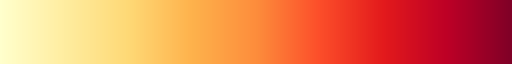

In [25]:
plt.get_cmap('YlOrRd')

In [26]:
# 시각화를 위한 색상 계산 함수
def compute_color(value, min_val, max_val):
    value = np.log1p(value)
    min_val = np.log1p(min_val)
    max_val = np.log1p(max_val)

    normed_value = (value - min_val) / (max_val - min_val)
    cmap = plt.get_cmap('YlOrRd')
    r, g, b, a_ = cmap(normed_value)
    return f'#{int(r * 255):02X}{int(g * 255):02X}{int(b * 255):02X}'

### **정적 시각화 (대여건수, 반납건수)**

In [27]:
# 대여소별 대여건수 시각화
min_usage = january_data['대여건수'].min()
max_usage = january_data['대여건수'].max()

m = folium.Map(location=[mean_lat, mean_lng], zoom_start=14)

for idx, row in january_data.iterrows():
    location = [row['stationLatitude'], row['stationLongitude']]
    usage = row['대여건수']
    color = compute_color(usage, min_usage, max_usage)

    tooltip_text = f"대여소명: {row['대여소명']}<br>대여건수: {row['대여건수']}<br>반납건수: {row['반납건수']}"
    tooltip = folium.Tooltip(tooltip_text)

    folium.CircleMarker(
        location=location,
        radius=5,
        color=color,
        tooltip=tooltip
    ).add_to(m)

m

In [28]:
# 대여건수와 반납건수 시각화
min_usage_rental = january_data['대여건수'].min()
max_usage_rental = january_data['대여건수'].max()

min_usage_return = january_data['반납건수'].min()
max_usage_return = january_data['반납건수'].max()

m = folium.Map(location=[mean_lat, mean_lng], zoom_start=14)

for idx, row in january_data.iterrows():
    location = [row['stationLatitude'], row['stationLongitude']]

    usage_rental = row['대여건수']
    color = compute_color(usage_rental, min_usage_rental, max_usage_rental)

    usage_return = row['반납건수']
    fill_color = compute_color(usage_return, min_usage_return, max_usage_return)

    tooltip_text = f"대여소명: {row['대여소명']}<br>대여건수: {row['대여건수']}<br>반납건수: {row['반납건수']}"
    tooltip = folium.Tooltip(tooltip_text)

    folium.CircleMarker(
        location=location,
        radius=5,
        color=color,
        tooltip=tooltip,
        fill=True,
        fill_color=fill_color,
        fill_opacity=1
    ).add_to(m)

m

### **동적 시각화 (대여건수, 반납건수)**

In [29]:
from ipywidgets import interact

In [30]:
merged_df['기준년월'].unique()

array([202301, 202302, 202303, 202304, 202305, 202306], dtype=int64)

In [31]:
months = [202301, 202302, 202303, 202304, 202305, 202306]
maps = {}

min_usage_rental = merged_df['대여건수'].min()
max_usage_rental = merged_df['대여건수'].max()

min_usage_return = merged_df['반납건수'].min()
max_usage_return = merged_df['반납건수'].max()

for month in months:
    month_data = merged_df[merged_df['기준년월'] == month]
    m = folium.Map(location=[mean_lat, mean_lng], zoom_start=14)

    for idx, row in month_data.iterrows():
        location = [row['stationLatitude'], row['stationLongitude']]

        usage_rental = row['대여건수']
        color = compute_color(usage_rental, min_usage_rental, max_usage_rental)

        usage_return = row['반납건수']
        fill_color = compute_color(usage_return, min_usage_return, max_usage_return)

        tooltip_text = f"대여소명: {row['대여소명']}<br>대여건수: {row['대여건수']}<br>반납건수: {row['반납건수']}"
        tooltip = folium.Tooltip(tooltip_text)

        folium.CircleMarker(
            location=location,
            radius=5,
            color=color,
            tooltip=tooltip,
            fill=True,
            fill_color=fill_color,
            fill_opacity=1
        ).add_to(m)

        maps[month] = m

In [32]:
def show_map(month):
    return maps[month]

In [33]:
# list를 활용한 interact 활용
interact(show_map, month=months)

interactive(children=(Dropdown(description='month', options=(202301, 202302, 202303, 202304, 202305, 202306), …

<function __main__.show_map(month)>

In [34]:
# tuple을 활용한 interact 활용
interact(show_map, month=(202301, 202306, 1))

interactive(children=(IntSlider(value=202303, description='month', max=202306, min=202301), Output()), _dom_cl…

<function __main__.show_map(month)>

In [35]:
# 1월, 2월에는 대여, 반납건수가 적지만
# 3월 이후부터 개강/개학 등 이유로 급격히 늘어남
import plotly.express as px

merged_df['반납건수'] = merged_df['반납건수'].fillna(0)

fig = px.scatter(merged_df,
                 hover_name='대여소명',
                 x='stationLongitude',
                 y='stationLatitude',
                 color='대여건수',
                 size='반납건수',
                 animation_frame='기준년월',
                 range_color=[merged_df['대여건수'].min(), merged_df['대여건수'].max()]
                 )

fig.update_layout(width=700, height=700)
fig.show()

### **history_df 활용**

#### **시간대별 시각화**

In [36]:
# object 타입의 데이터를 datetime 타입으로 변환 후 시간 추출
history_df['대여시간'] = pd.to_datetime(history_df['대여일시']).dt.hour
history_df.head()

,자전거번호,대여일시,대여 대여소번호,대여 대여소명,대여거치대,반납일시,반납대여소번호,반납대여소명,반납거치대,이용시간(분),이용거리(M),생년,성별,이용자종류,대여대여소ID,반납대여소ID,대여시간
0,SPB-39194,2023-01-01 00:02:13,1554,번동사거리,0,2023-01-01 00:02:43,1554.0,번동사거리,0,0,0.0,1977,\N,내국인,ST-2127,ST-2127,0
1,SPB-43457,2023-01-01 00:01:20,1653,노원역1번출구,0,2023-01-01 00:03:28,4003.0,상계초교 입구 교차로 명주빌딩 앞,0,2,0.0,1998,\N,내국인,ST-1121,ST-2699,0
2,SPB-44383,2023-01-01 00:04:01,2601,석촌호수 아뜰리에,0,2023-01-01 00:04:21,2601.0,석촌호수 아뜰리에,0,0,0.0,1993,M,내국인,ST-1590,ST-1590,0
3,SPB-37186,2023-01-01 00:02:09,1080,엘웨딩,0,2023-01-01 00:04:59,3668.0,성내삼성아파트,0,2,0.0,1965,M,내국인,ST-1841,ST-2740,0
4,SPB-59440,2023-01-01 00:02:24,1351,안암2교 옆,0,2023-01-01 00:05:02,1308.0,안암로터리 버스정류장 앞,0,2,780.0,1986,M,내국인,ST-1215,ST-827,0


In [37]:
hourly_history_counts = history_df['대여시간'].value_counts().sort_index()
hourly_history_counts

대여시간
0      35067
1      26956
2      17923
3      12209
4       9965
5      16977
6      32554
7      71106
8     136232
9      76931
10     57062
11     67232
12     77150
13     79342
14     81564
15     88384
16    101124
17    130839
18    159759
19    103218
20     80281
21     71436
22     61798
23     40487
Name: count, dtype: int64

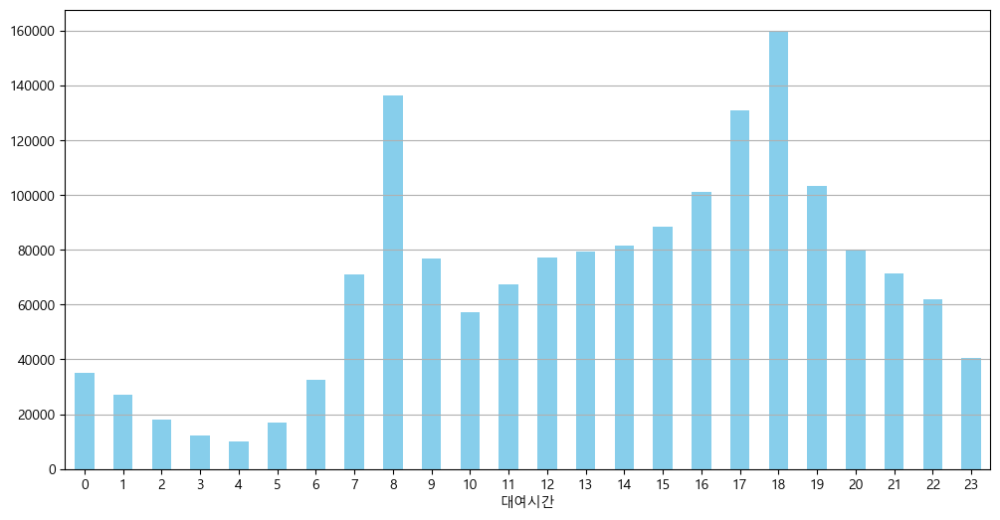

In [38]:
# 시간대별 이용건수 시각화
# 출퇴근 시간에 많이 이용하는 것으로 볼 수 있음.
plt.figure(figsize=(12, 6))

hourly_history_counts.plot(kind='bar',
                           color='skyblue')

plt.xticks(rotation=0)

plt.grid(axis='y')
plt.show()

In [39]:
duration_mean_by_hour = history_df.groupby('대여시간')['이용시간(분)'].mean()
duration_mean_by_hour

대여시간
0     14.493655
1     15.160150
2     15.565642
3     15.470555
4     16.164777
5     15.851976
6     13.350894
7     12.218800
8     11.257120
9     14.432127
10    18.758473
11    21.733906
12    20.760557
13    21.180094
14    22.497646
15    22.325070
16    21.247261
17    19.160961
18    17.876195
19    18.119911
20    17.906815
21    16.028263
22    14.158063
23    13.511176
Name: 이용시간(분), dtype: float64

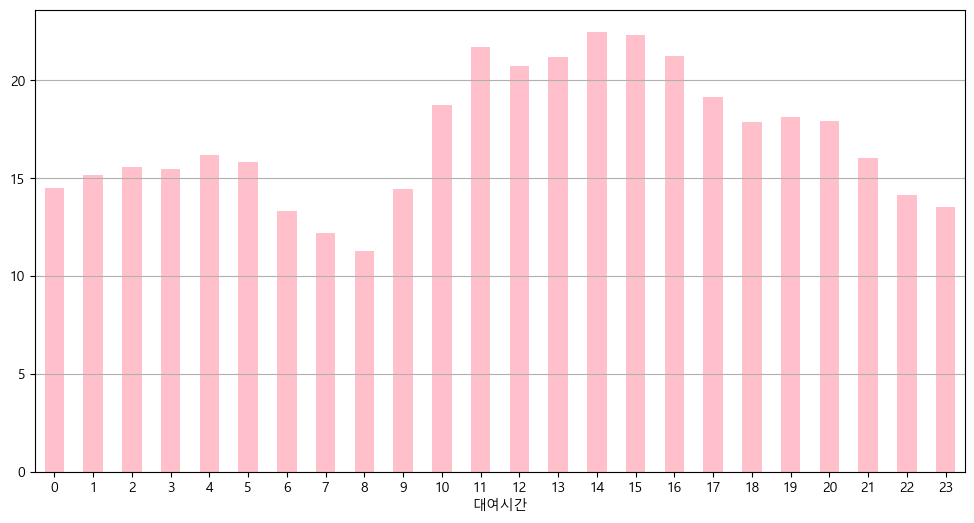

In [40]:
# 시간대별 이용시간 시각화
plt.figure(figsize=(12, 6))

duration_mean_by_hour.plot(kind='bar',
                           color='pink')

plt.xticks(rotation=0)

plt.grid(axis='y')
plt.show()

In [41]:
distance_mean_by_hour = history_df.groupby('대여시간')['이용거리(M)'].mean()
distance_mean_by_hour

대여시간
0     1874.772940
1     2014.279551
2     2045.524105
3     2102.836122
4     2085.120263
5     1795.032152
6     1579.436651
7     1665.425539
8     1524.460394
9     1557.101565
10    1732.110527
11    1827.255761
12    1879.719457
13    1979.879457
14    2143.837400
15    2166.055266
16    2103.231668
17    2046.305372
18    1982.236826
19    1865.700816
20    1905.038096
21    1847.857722
22    1736.991495
23    1647.362211
Name: 이용거리(M), dtype: float64

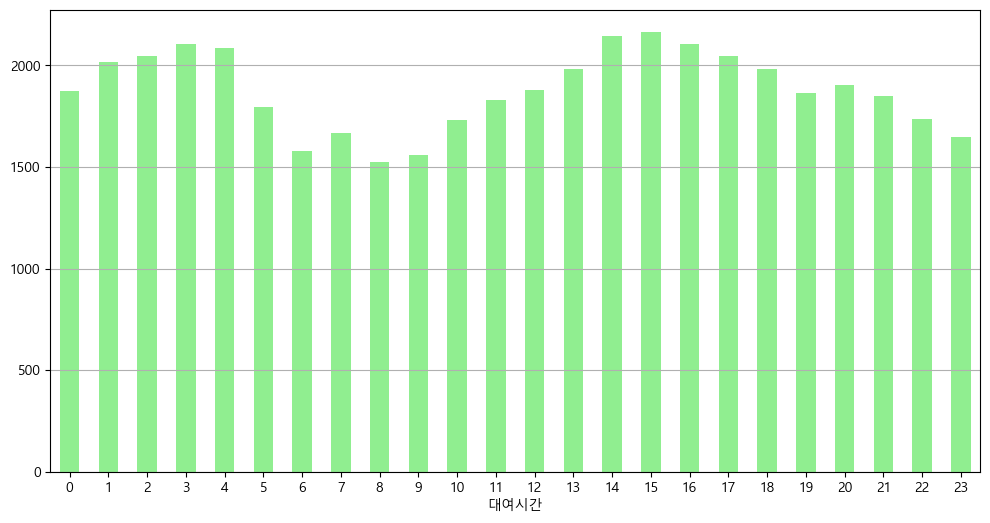

In [42]:
# 시간대별 이용거리 시각화
# 이용시간과 이용거리가 비슷한 양상을 띈다.
plt.figure(figsize=(12, 6))

distance_mean_by_hour.plot(kind='bar',
                           color='lightgreen')

plt.xticks(rotation=0)

plt.grid(axis='y')
plt.show()

### **성별별 시각화**

In [43]:
history_df['성별'].unique()

array(['\\N', 'M', 'F', nan, 'f', 'm'], dtype=object)

In [44]:
# 성별 데이터 통일하기
history_df['성별'] = history_df['성별'].replace({'m': 'M', 'f': 'F', np.nan: '\\N'})

In [45]:
gender_counts = history_df.groupby('성별').size()
gender_counts

성별
F     378330
M     723944
\N    533322
dtype: int64

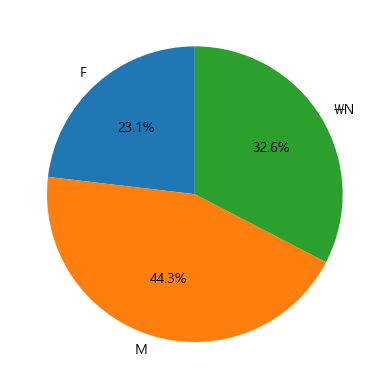

In [46]:
# 성별별 이용량 시각화
gender_counts.plot(kind='pie',
                   autopct='%1.1f%%',
                   startangle=90)
plt.show()

In [47]:
gender_counts_by_hour = history_df.groupby(['대여시간', '성별']).size().unstack().fillna(0)
gender_counts_by_hour

성별,F,M,\N
대여시간,,,
0,4621,18229,12217
1,3141,14494,9321
2,1865,9817,6241
3,1187,6696,4326
4,1284,5630,3051
5,3359,8537,5081
6,5940,16486,10128
7,14722,33264,23120
8,34626,56996,44610


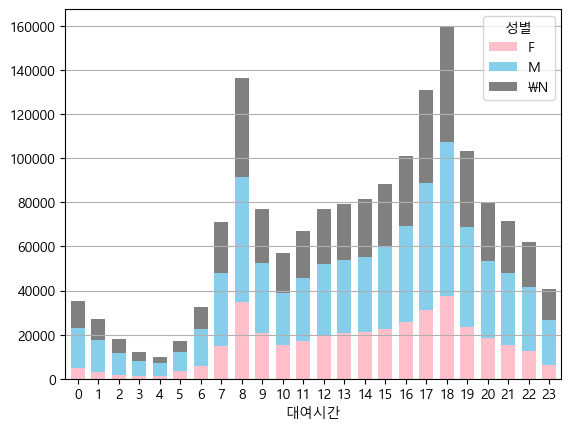

In [48]:
# 성별별 이용시간 시각화
colors = ['pink', 'skyblue', 'gray']
gender_counts_by_hour.plot(kind='bar',
                           stacked=True,
                           color=colors,
                           width=0.7)

plt.xticks(rotation=0)

plt.grid(axis='y')
plt.show()

In [49]:
gender_ratios_by_hour = (gender_counts_by_hour.T / gender_counts_by_hour.sum(axis=1)).T
gender_ratios_by_hour

성별,F,M,\N
대여시간,,,
0,0.131776,0.519833,0.348390
1,0.116523,0.537691,0.345786
2,0.104056,0.547732,0.348212
3,0.097223,0.548448,0.354329
4,0.128851,0.564977,0.306172
5,0.197856,0.502857,0.299287
6,0.182466,0.506420,0.311114
7,0.207043,0.467809,0.325148
8,0.254169,0.418375,0.327456


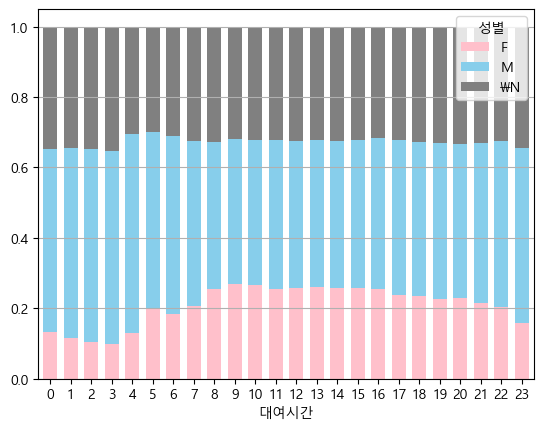

In [50]:
# 성별별 이용시간 비율 시각화
colors = ['pink', 'skyblue', 'gray']
gender_ratios_by_hour.plot(kind='bar',
                           stacked=True,
                           color=colors,
                           width=0.7)

plt.xticks(rotation=0)

plt.grid(axis='y')
plt.show()

### **연령대별 시각화**

In [51]:
history_df['생년'].unique()

array(['1977', '1998', '1993', '1965', '1986', '2003', '1972', '1990',
       '1961', '1969', '2004', '1999', '\\N', '2000', '1997', '2005',
       '2001', '1967', '1982', '1994', '1966', '1996', '1964', '1975',
       '1992', '1968', '1995', '1973', '1952', '1958', '1962', '1989',
       '2006', '1991', '2002', '1901', '1976', '1988', '1978', '1980',
       '1971', '1987', '1983', '1979', '1960', '1963', '1959', '1974',
       '1951', '1984', '1985', '1970', '1981', '1950', '2007', '1944',
       '1954', '2009', '2068', '1957', '1955', '1953', '2020', '2076',
       '1956', '2017', '2091', '1902', '1900', '2008', '2053', '1949',
       '2019', '1903', '2094', '1943', '1942', '1948', '2079', '1939',
       '1947', '2064', '2086', '1931', '1945', '1906', '2072', '1946',
       '1935', '1938', '2083', '0000', '1941', '1937', '2080', '2085',
       '2084', '2092', '2057', '1932', '2063', '2087', '2012', '1905',
       '1933', '2013', '1907', '2061', '2051', '2082', '1934', '1904',
       

In [52]:
# 결측치 처리 후 데이터 타입 변경
history_df['생년'] = history_df['생년'].replace('\\N', np.nan)
history_df['생년'] = history_df['생년'].astype(float)
history_df['생년'].unique()

array([1977., 1998., 1993., 1965., 1986., 2003., 1972., 1990., 1961.,
       1969., 2004., 1999.,   nan, 2000., 1997., 2005., 2001., 1967.,
       1982., 1994., 1966., 1996., 1964., 1975., 1992., 1968., 1995.,
       1973., 1952., 1958., 1962., 1989., 2006., 1991., 2002., 1901.,
       1976., 1988., 1978., 1980., 1971., 1987., 1983., 1979., 1960.,
       1963., 1959., 1974., 1951., 1984., 1985., 1970., 1981., 1950.,
       2007., 1944., 1954., 2009., 2068., 1957., 1955., 1953., 2020.,
       2076., 1956., 2017., 2091., 1902., 1900., 2008., 2053., 1949.,
       2019., 1903., 2094., 1943., 1942., 1948., 2079., 1939., 1947.,
       2064., 2086., 1931., 1945., 1906., 2072., 1946., 1935., 1938.,
       2083.,    0., 1941., 1937., 2080., 2085., 2084., 2092., 2057.,
       1932., 2063., 2087., 2012., 1905., 1933., 2013., 1907., 2061.,
       2051., 2082., 1934., 1904., 2075., 2096., 2060., 2065., 1936.,
       1912., 2099., 2090., 2071., 2095., 2093., 2078., 2081., 2059.,
       2021., 1940.,

In [53]:
import datetime

current_year = datetime.datetime.now().year
current_year

2025

In [54]:
# 이상치 제거 및 2010년까지의 데이터만 선택
filtered_history_df = history_df.copy()
filtered_history_df = filtered_history_df[(filtered_history_df['생년'] > 0) & (filtered_history_df['생년'] <= 2010)]

In [55]:
# 현재를 기준으로 연령 컬럼 추가
filtered_history_df['연령'] = current_year - filtered_history_df['생년']
filtered_history_df.head()

,자전거번호,대여일시,대여 대여소번호,대여 대여소명,대여거치대,반납일시,반납대여소번호,반납대여소명,반납거치대,이용시간(분),이용거리(M),생년,성별,이용자종류,대여대여소ID,반납대여소ID,대여시간,연령
0,SPB-39194,2023-01-01 00:02:13,1554,번동사거리,0,2023-01-01 00:02:43,1554.0,번동사거리,0,0,0.0,1977.0,\N,내국인,ST-2127,ST-2127,0,48.0
1,SPB-43457,2023-01-01 00:01:20,1653,노원역1번출구,0,2023-01-01 00:03:28,4003.0,상계초교 입구 교차로 명주빌딩 앞,0,2,0.0,1998.0,\N,내국인,ST-1121,ST-2699,0,27.0
2,SPB-44383,2023-01-01 00:04:01,2601,석촌호수 아뜰리에,0,2023-01-01 00:04:21,2601.0,석촌호수 아뜰리에,0,0,0.0,1993.0,M,내국인,ST-1590,ST-1590,0,32.0
3,SPB-37186,2023-01-01 00:02:09,1080,엘웨딩,0,2023-01-01 00:04:59,3668.0,성내삼성아파트,0,2,0.0,1965.0,M,내국인,ST-1841,ST-2740,0,60.0
4,SPB-59440,2023-01-01 00:02:24,1351,안암2교 옆,0,2023-01-01 00:05:02,1308.0,안암로터리 버스정류장 앞,0,2,780.0,1986.0,M,내국인,ST-1215,ST-827,0,39.0


In [56]:
# 연령대별로 비닝처리
age_bin = [13, 20, 30, 40, 50, 60, 70, 80, 90, 100]
age_labels = ['13-19', '20-29', '30-39', '40-49', '50-59', '60-69', '70-79', '80-89', '90+']

filtered_history_df['연령대'] = pd.cut(filtered_history_df['연령'],
                                      bins=age_bin,
                                      labels=age_labels,
                                      right=False)
filtered_history_df.head()

,자전거번호,대여일시,대여 대여소번호,대여 대여소명,대여거치대,반납일시,반납대여소번호,반납대여소명,반납거치대,이용시간(분),이용거리(M),생년,성별,이용자종류,대여대여소ID,반납대여소ID,대여시간,연령,연령대
0,SPB-39194,2023-01-01 00:02:13,1554,번동사거리,0,2023-01-01 00:02:43,1554.0,번동사거리,0,0,0.0,1977.0,\N,내국인,ST-2127,ST-2127,0,48.0,40-49
1,SPB-43457,2023-01-01 00:01:20,1653,노원역1번출구,0,2023-01-01 00:03:28,4003.0,상계초교 입구 교차로 명주빌딩 앞,0,2,0.0,1998.0,\N,내국인,ST-1121,ST-2699,0,27.0,20-29
2,SPB-44383,2023-01-01 00:04:01,2601,석촌호수 아뜰리에,0,2023-01-01 00:04:21,2601.0,석촌호수 아뜰리에,0,0,0.0,1993.0,M,내국인,ST-1590,ST-1590,0,32.0,30-39
3,SPB-37186,2023-01-01 00:02:09,1080,엘웨딩,0,2023-01-01 00:04:59,3668.0,성내삼성아파트,0,2,0.0,1965.0,M,내국인,ST-1841,ST-2740,0,60.0,60-69
4,SPB-59440,2023-01-01 00:02:24,1351,안암2교 옆,0,2023-01-01 00:05:02,1308.0,안암로터리 버스정류장 앞,0,2,780.0,1986.0,M,내국인,ST-1215,ST-827,0,39.0,30-39


In [57]:
age_counts = filtered_history_df['연령대'].value_counts().sort_index()
age_counts

연령대
13-19     29998
20-29    415514
30-39    490150
40-49    267989
50-59    203934
60-69     83960
70-79     13273
80-89      2281
90+         442
Name: count, dtype: int64

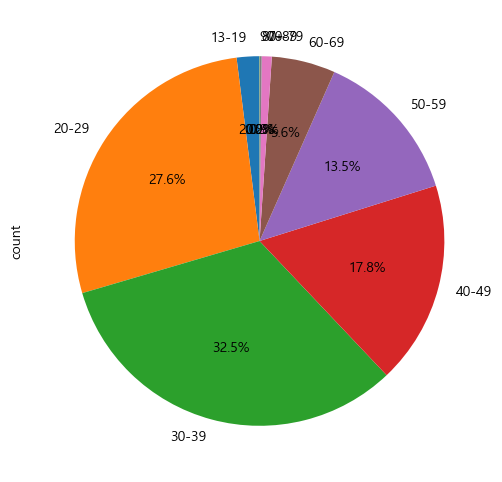

In [58]:
# 연령대별 이용량 시각화
plt.figure(figsize=(8, 6))

age_counts.plot(kind='pie',
                autopct='%1.1f%%',
                startangle=90)

plt.show()

<Figure size 1600x800 with 0 Axes>

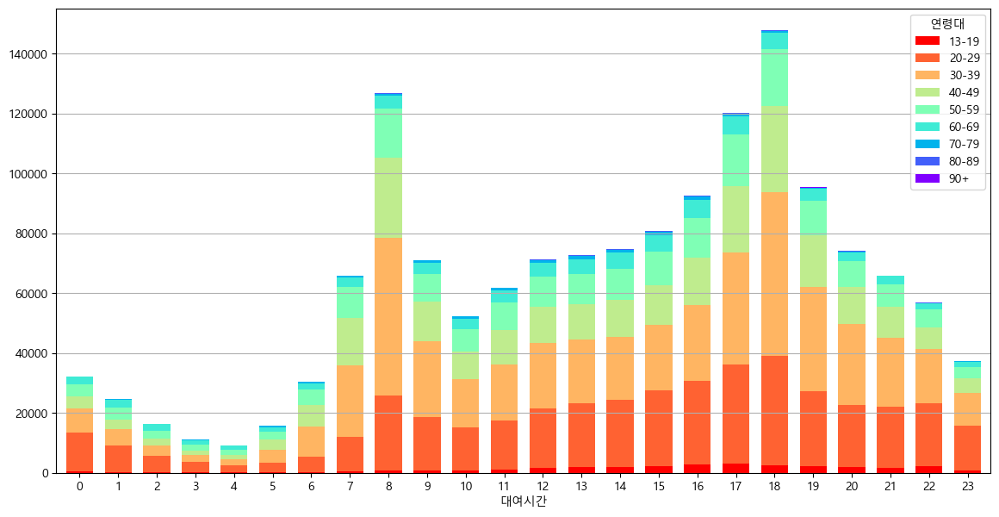

In [59]:
# 연령대별 대여시간 시각화
age_counts_by_hour = filtered_history_df.groupby(['대여시간', '연령대']).size().unstack().fillna(0)

plt.figure(figsize=(16, 8))

age_counts_by_hour.plot(kind='bar',
                        stacked=True,
                        figsize=(14,7),
                        cmap="rainbow_r",
                        width=0.7)

plt.xticks(rotation=0)

plt.grid(axis='y')
plt.show()

### **주말, 평일별 시각화**

In [60]:
history_df['대여일'] = pd.to_datetime(history_df['대여일시']).dt.date
history_df['대여일'] = pd.to_datetime(history_df['대여일'])
history_df.head()

,자전거번호,대여일시,대여 대여소번호,대여 대여소명,대여거치대,반납일시,반납대여소번호,반납대여소명,반납거치대,이용시간(분),이용거리(M),생년,성별,이용자종류,대여대여소ID,반납대여소ID,대여시간,대여일
0,SPB-39194,2023-01-01 00:02:13,1554,번동사거리,0,2023-01-01 00:02:43,1554.0,번동사거리,0,0,0.0,1977.0,\N,내국인,ST-2127,ST-2127,0,2023-01-01
1,SPB-43457,2023-01-01 00:01:20,1653,노원역1번출구,0,2023-01-01 00:03:28,4003.0,상계초교 입구 교차로 명주빌딩 앞,0,2,0.0,1998.0,\N,내국인,ST-1121,ST-2699,0,2023-01-01
2,SPB-44383,2023-01-01 00:04:01,2601,석촌호수 아뜰리에,0,2023-01-01 00:04:21,2601.0,석촌호수 아뜰리에,0,0,0.0,1993.0,M,내국인,ST-1590,ST-1590,0,2023-01-01
3,SPB-37186,2023-01-01 00:02:09,1080,엘웨딩,0,2023-01-01 00:04:59,3668.0,성내삼성아파트,0,2,0.0,1965.0,M,내국인,ST-1841,ST-2740,0,2023-01-01
4,SPB-59440,2023-01-01 00:02:24,1351,안암2교 옆,0,2023-01-01 00:05:02,1308.0,안암로터리 버스정류장 앞,0,2,780.0,1986.0,M,내국인,ST-1215,ST-827,0,2023-01-01


In [61]:
history_df['주말'] = history_df['대여일'].dt.weekday >= 5
history_df.head()

,자전거번호,대여일시,대여 대여소번호,대여 대여소명,대여거치대,반납일시,반납대여소번호,반납대여소명,반납거치대,이용시간(분),이용거리(M),생년,성별,이용자종류,대여대여소ID,반납대여소ID,대여시간,대여일,주말
0,SPB-39194,2023-01-01 00:02:13,1554,번동사거리,0,2023-01-01 00:02:43,1554.0,번동사거리,0,0,0.0,1977.0,\N,내국인,ST-2127,ST-2127,0,2023-01-01,True
1,SPB-43457,2023-01-01 00:01:20,1653,노원역1번출구,0,2023-01-01 00:03:28,4003.0,상계초교 입구 교차로 명주빌딩 앞,0,2,0.0,1998.0,\N,내국인,ST-1121,ST-2699,0,2023-01-01,True
2,SPB-44383,2023-01-01 00:04:01,2601,석촌호수 아뜰리에,0,2023-01-01 00:04:21,2601.0,석촌호수 아뜰리에,0,0,0.0,1993.0,M,내국인,ST-1590,ST-1590,0,2023-01-01,True
3,SPB-37186,2023-01-01 00:02:09,1080,엘웨딩,0,2023-01-01 00:04:59,3668.0,성내삼성아파트,0,2,0.0,1965.0,M,내국인,ST-1841,ST-2740,0,2023-01-01,True
4,SPB-59440,2023-01-01 00:02:24,1351,안암2교 옆,0,2023-01-01 00:05:02,1308.0,안암로터리 버스정류장 앞,0,2,780.0,1986.0,M,내국인,ST-1215,ST-827,0,2023-01-01,True


In [62]:
duration_mean_weekday = history_df[~history_df['주말']]['이용시간(분)'].mean()
duration_mean_weekend = history_df[history_df['주말']]['이용시간(분)'].mean()

distance_mean_weekday = history_df[~history_df['주말']]['이용거리(M)'].mean()
distance_mean_weekend = history_df[history_df['주말']]['이용거리(M)'].mean()

daily_counts_weekday = history_df[~history_df['주말']].groupby('대여일').size().mean()
daily_counts_weekend = history_df[history_df['주말']].groupby('대여일').size().mean()

duration_mean_weekday, duration_mean_weekend, distance_mean_weekday, distance_mean_weekend, daily_counts_weekday, daily_counts_weekend

(17.230301490015258,
 19.10807931642687,
 1841.0368217344508,
 2027.631528407261,
 60093.954545454544,
 34836.555555555555)

<Figure size 1200x600 with 0 Axes>

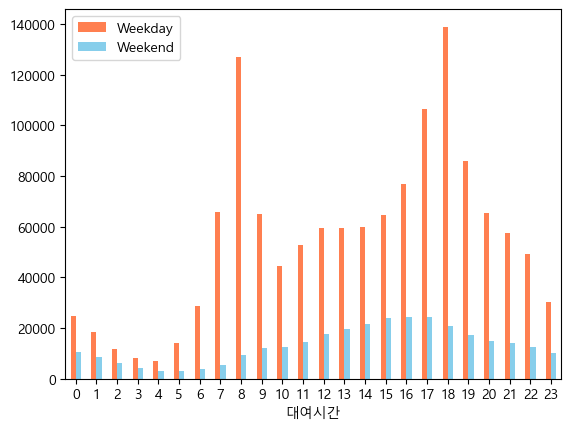

In [ ]:
# 주말, 평일별 대여시간에 따른 이용량 시각화
# 평일이 주말보다 이용량이 많음
grouped_data = history_df.groupby(['주말', '대여시간']).size().unstack(level=0)

plt.figure(figsize=(12, 6))

grouped_data.plot(kind='bar',
                  color=['coral', 'skyblue'])

plt.xticks(rotation=0)

plt.legend(['Weekday', 'Weekend'])
plt.show()

<Figure size 1200x600 with 0 Axes>

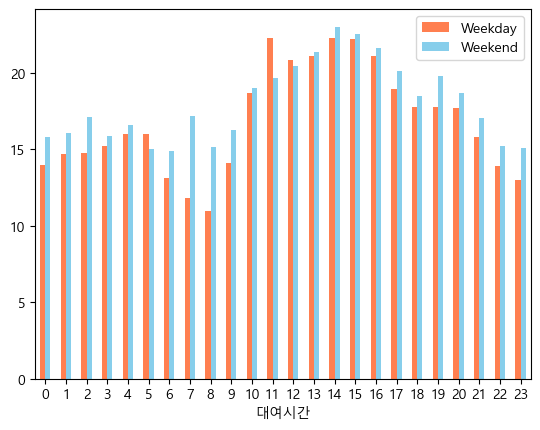

In [ ]:
# 주말, 평일별 대여시간에 따른 이용시간 시각화
# 그러나 주말이 평일보다 대여시간이 더 긴 것을 볼 수 있음.
# 평일은 출퇴근으로 인해 시간은 짧지만 많이 이용하는가?
grouped_data = history_df.groupby(['주말', '대여시간'])[['이용시간(분)']].mean().unstack(level=0)

plt.figure(figsize=(12, 6))

grouped_data.plot(kind='bar',
                  color=['coral', 'skyblue'])

plt.xticks(rotation=0)

plt.legend(['Weekday', 'Weekend'])
plt.show()

In [66]:
filtered_history_df['대여일'] = pd.to_datetime(filtered_history_df['대여일시']).dt.date
filtered_history_df['대여일'] = pd.to_datetime(filtered_history_df['대여일'])
filtered_history_df.head()

,자전거번호,대여일시,대여 대여소번호,대여 대여소명,대여거치대,반납일시,반납대여소번호,반납대여소명,반납거치대,이용시간(분),이용거리(M),생년,성별,이용자종류,대여대여소ID,반납대여소ID,대여시간,연령,연령대,대여일
0,SPB-39194,2023-01-01 00:02:13,1554,번동사거리,0,2023-01-01 00:02:43,1554.0,번동사거리,0,0,0.0,1977.0,\N,내국인,ST-2127,ST-2127,0,48.0,40-49,2023-01-01
1,SPB-43457,2023-01-01 00:01:20,1653,노원역1번출구,0,2023-01-01 00:03:28,4003.0,상계초교 입구 교차로 명주빌딩 앞,0,2,0.0,1998.0,\N,내국인,ST-1121,ST-2699,0,27.0,20-29,2023-01-01
2,SPB-44383,2023-01-01 00:04:01,2601,석촌호수 아뜰리에,0,2023-01-01 00:04:21,2601.0,석촌호수 아뜰리에,0,0,0.0,1993.0,M,내국인,ST-1590,ST-1590,0,32.0,30-39,2023-01-01
3,SPB-37186,2023-01-01 00:02:09,1080,엘웨딩,0,2023-01-01 00:04:59,3668.0,성내삼성아파트,0,2,0.0,1965.0,M,내국인,ST-1841,ST-2740,0,60.0,60-69,2023-01-01
4,SPB-59440,2023-01-01 00:02:24,1351,안암2교 옆,0,2023-01-01 00:05:02,1308.0,안암로터리 버스정류장 앞,0,2,780.0,1986.0,M,내국인,ST-1215,ST-827,0,39.0,30-39,2023-01-01


In [67]:
filtered_history_df['주말'] = filtered_history_df['대여일'].dt.weekday >= 5
filtered_history_df.head()

,자전거번호,대여일시,대여 대여소번호,대여 대여소명,대여거치대,반납일시,반납대여소번호,반납대여소명,반납거치대,이용시간(분),...,생년,성별,이용자종류,대여대여소ID,반납대여소ID,대여시간,연령,연령대,대여일,주말
0,SPB-39194,2023-01-01 00:02:13,1554,번동사거리,0,2023-01-01 00:02:43,1554.0,번동사거리,0,0,...,1977.0,\N,내국인,ST-2127,ST-2127,0,48.0,40-49,2023-01-01,True
1,SPB-43457,2023-01-01 00:01:20,1653,노원역1번출구,0,2023-01-01 00:03:28,4003.0,상계초교 입구 교차로 명주빌딩 앞,0,2,...,1998.0,\N,내국인,ST-1121,ST-2699,0,27.0,20-29,2023-01-01,True
2,SPB-44383,2023-01-01 00:04:01,2601,석촌호수 아뜰리에,0,2023-01-01 00:04:21,2601.0,석촌호수 아뜰리에,0,0,...,1993.0,M,내국인,ST-1590,ST-1590,0,32.0,30-39,2023-01-01,True
3,SPB-37186,2023-01-01 00:02:09,1080,엘웨딩,0,2023-01-01 00:04:59,3668.0,성내삼성아파트,0,2,...,1965.0,M,내국인,ST-1841,ST-2740,0,60.0,60-69,2023-01-01,True
4,SPB-59440,2023-01-01 00:02:24,1351,안암2교 옆,0,2023-01-01 00:05:02,1308.0,안암로터리 버스정류장 앞,0,2,...,1986.0,M,내국인,ST-1215,ST-827,0,39.0,30-39,2023-01-01,True


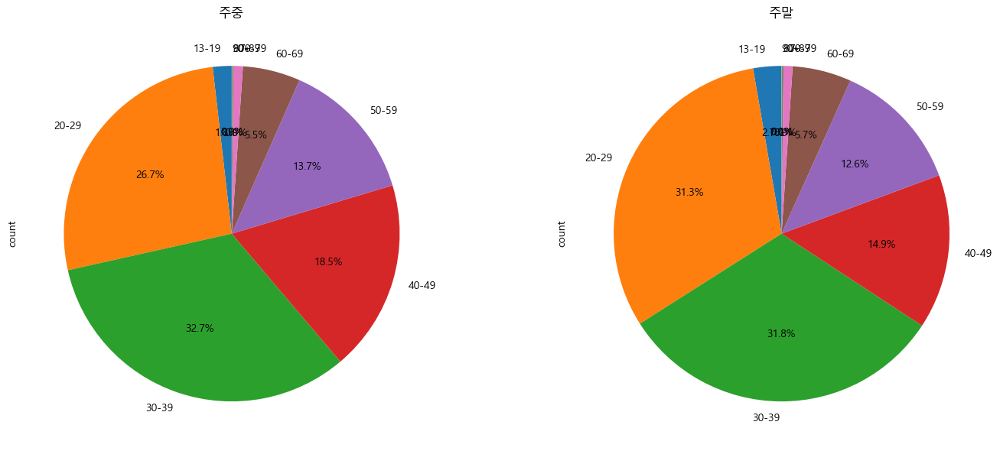

In [ ]:
# 주말, 평일 연령대별 이용량 비율 시각화
# 주말과 평일 둘 다 연령대별 이용량 비율은 비슷한 것으로 나타남
# 그러나 주로 출퇴근을 하는 20 ~ 40대 고객의 이용량이 줄어든 것이 보임
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

# 주중 데이터
weekday_data = filtered_history_df[filtered_history_df['주말'] == False]
weekday_age_counts = weekday_data['연령대'].value_counts().sort_index()
weekday_age_counts.plot(kind='pie',
                        autopct='%1.1f%%',
                        startangle=90,
                        ax=ax[0],
                        title='주중')

# 주말 데이터
weekend_data = filtered_history_df[filtered_history_df['주말'] == True]
weekend_age_counts = weekend_data['연령대'].value_counts().sort_index()
weekend_age_counts.plot(kind='pie',
                        autopct='%1.1f%%',
                        startangle=90,
                        ax=ax[1],
                        title='주말')

plt.tight_layout()
plt.show()

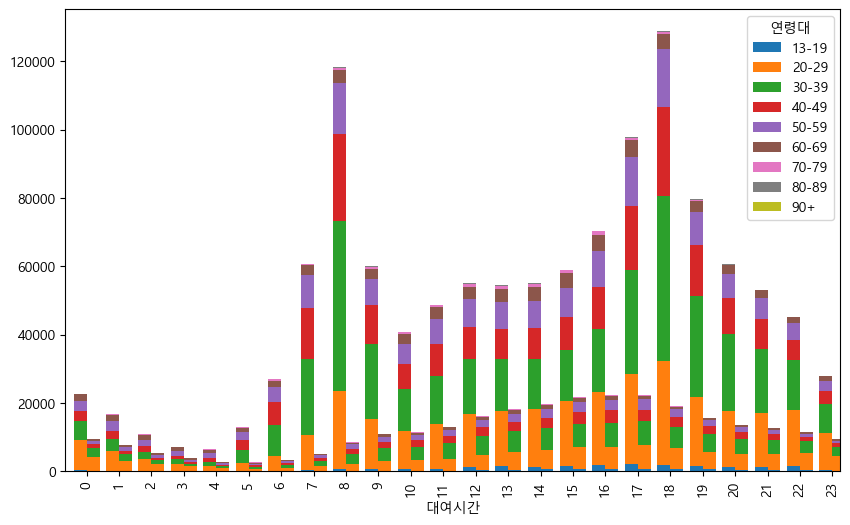

In [ ]:
# 주말, 평일 연령대별 이용시간 비율 시각화
grouped_data = filtered_history_df.groupby(['주말', '대여시간', '연령대']).size().unstack(level=0)

fig, ax = plt.subplots(figsize=(10, 6))

# 주말 데이터 스택
grouped_data[True].unstack(level='연령대').plot(kind='bar',
                                               stacked=True,
                                               position=0,
                                               width=0.4,
                                               ax=ax)

# 주중 데이터 스택
grouped_data[False].unstack(level='연령대').plot(kind='bar',
                                               stacked=True,
                                               position=1,
                                               width=0.4,
                                               ax=ax,
                                               legend=False)

plt.show()

### **시간 흐름에 따른 대여건수 변화 시각화**

In [72]:
history_df['대여일'] = history_df['대여일'].dt.date

In [73]:
grouped_rentals_df = history_df.groupby(['대여일', '대여시간', '대여 대여소명']).size().reset_index(name='대여건수')
grouped_rentals_df.head()

,대여일,대여시간,대여 대여소명,대여건수
0,2023-01-01,0,419민주묘지역,1
1,2023-01-01,0,7번가피자 서교망원점,1
2,2023-01-01,0,CJ 드림시티,1
3,2023-01-01,0,CJ오쇼핑앞,1
4,2023-01-01,0,CJ제일제당 앞,1


In [74]:
station_df['대여 대여소명'] = station_df['stationName'].str.split('.').str[1].str.strip()
station_df.head()

,rackTotCnt,stationName,parkingBikeTotCnt,shared,stationLatitude,stationLongitude,stationId,대여 대여소명
0,15,102. 망원역 1번출구 앞,13,87,37.555649,126.910629,ST-4,망원역 1번출구 앞
1,14,103. 망원역 2번출구 앞,24,171,37.554951,126.910835,ST-5,망원역 2번출구 앞
2,13,104. 합정역 1번출구 앞,5,38,37.550739,126.915085,ST-6,합정역 1번출구 앞
3,5,105. 합정역 5번출구 앞,0,0,37.550007,126.914825,ST-7,합정역 5번출구 앞
4,12,106. 합정역 7번출구 앞,10,83,37.548645,126.912827,ST-8,합정역 7번출구 앞


In [78]:
merged_data = pd.merge(grouped_rentals_df,
                     station_df,
                     on='대여 대여소명',
                     how='inner')
merged_data.head()

,대여일,대여시간,대여 대여소명,대여건수,rackTotCnt,stationName,parkingBikeTotCnt,shared,stationLatitude,stationLongitude,stationId
0,2023-01-01,0,7번가피자 서교망원점,1,8,184. 7번가피자 서교망원점,5,63,37.558949,126.907753,ST-342
1,2023-01-01,0,CJ 드림시티,1,10,907. CJ 드림시티,17,170,37.599495,126.916985,ST-455
2,2023-01-01,0,CJ제일제당 앞,1,8,380. CJ제일제당 앞,8,100,37.563866,127.002747,ST-195
3,2023-01-01,0,DMC엘가아파트 앞,1,12,3120.DMC엘가아파트 앞,0,0,37.569836,126.918091,ST-2205
4,2023-01-01,0,DMC역 2번출구 옆,1,20,417. DMC역 2번출구 옆,8,40,37.575069,126.899918,ST-93


In [79]:
merged_data.columns

Index(['대여일', '대여시간', '대여 대여소명', '대여건수', 'rackTotCnt', 'stationName',
       'parkingBikeTotCnt', 'shared', 'stationLatitude', 'stationLongitude',
       'stationId'],
      dtype='object')

In [91]:
date_groupby_df = merged_data.groupby(['대여일', '대여 대여소명']).agg({
    '대여건수': 'sum',
    'stationLatitude': 'first',
    'stationLongitude': 'first'
}).reset_index()
date_groupby_df.head()

,대여일,대여 대여소명,대여건수,stationLatitude,stationLongitude
0,2023-01-01,(시립)고덕평생학습관,4,37.555702,127.157921
1,2023-01-01,(재)FITI시험연구원,7,37.568485,126.838570
2,2023-01-01,3호선 매봉역 3번출구앞,20,37.486767,127.046761
3,2023-01-01,63스퀘어,16,37.520710,126.939659
4,2023-01-01,7번가피자 서교망원점,39,37.558949,126.907753


In [92]:
date_groupby_df.columns

Index(['대여일', '대여 대여소명', '대여건수', 'stationLatitude', 'stationLongitude'], dtype='object')

In [93]:
# 색상의 범위를 구하는 함수
def get_range_color(s):
    q1 = s.quantile(0.25)
    q3 = s.quantile(0.75)
    iqr = q3 - q1

    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    range_color = [
        max(s.min(), lower_bound),
        min(s.max(), upper_bound)
    ]

    return range_color

In [94]:
# 데이터가 완전하게 짝지어져 있지않고,
# 결측의 경우 아예 레코드가 없는 경우가 있어서
# 동적 시각화 시 포인트가 움직임
# 처리 필요!
fig = px.scatter(date_groupby_df,
                 x='stationLongitude',
                 y='stationLatitude',
                 animation_frame='대여일',
                 range_color=get_range_color(date_groupby_df['대여건수']),
                 hover_name='대여 대여소명',
                 color='대여건수')
fig.show()

In [ ]:
# 대여일 (2023-01-01 ~ 2023-01-31)을 기준으로 
# 각 대여 장소별 대여건수에 따른 피봇테이블 생성
# 이렇게 하면 대여건수가 없는 날짜의 데이터도 0으로 채워지게 됨.
# fill_value=0 (0으로 채우는 파라미터)
pivot_df = date_groupby_df.pivot_table(index='대여일',
                                       columns='대여 대여소명',
                                       values='대여건수',
                                       fill_value=0).reset_index()
print(pivot_df.shape) # (31, 2424)
pivot_df.head()

(31, 2424)


대여 대여소명,대여일,(시립)고덕평생학습관,(재)FITI시험연구원,3호선 매봉역 3번출구앞,63스퀘어,7번가피자 서교망원점,7호선 이수역7번출구,9호선종합운동장역 9번출구,CBS방송국 앞,CJ 드림시티,...,흑석롯데캐슬에듀포레(107동),흑석역 1번출구,흑석역 4번출구,흑석한강푸르지오 106동앞,흑석한강푸르지오(110동),흥국사 정류장,희성오피앙,희훈타워빌 앞,힐스테이트에코,힐스테이트클래시안아파트
0,2023-01-01,4.0,7.0,20.0,16.0,39.0,12.0,7.0,68.0,59.0,...,6.0,10.0,1.0,0.0,2.0,0.0,15.0,20.0,34.0,17.0
1,2023-01-02,8.0,48.0,27.0,46.0,46.0,14.0,31.0,88.0,57.0,...,5.0,28.0,4.0,4.0,3.0,0.0,17.0,35.0,80.0,15.0
2,2023-01-03,17.0,50.0,23.0,41.0,32.0,13.0,34.0,116.0,55.0,...,5.0,20.0,10.0,2.0,1.0,2.0,15.0,46.0,80.0,13.0
3,2023-01-04,19.0,56.0,28.0,51.0,39.0,10.0,39.0,133.0,55.0,...,7.0,24.0,4.0,1.0,6.0,0.0,11.0,38.0,88.0,22.0
4,2023-01-05,13.0,51.0,34.0,44.0,42.0,12.0,41.0,113.0,64.0,...,4.0,20.0,7.0,1.0,4.0,0.0,15.0,43.0,83.0,25.0


In [ ]:
# 위에서 만든 피봇테이블을 대여 대여소명마다 31일로 나누어 개수를 맞춤
reshaped_df = pivot_df.melt(id_vars=['대여일'],
                            value_name='대여건수',
                            var_name='대여 대여소명')
print(reshaped_df.shape)
print(31 * (2424 - 1)) # 피봇 테이블에서 대여일 컬럼을 제외한 대여소마다 31개 데이터 생성
reshaped_df.head()

(75113, 3)
75113


,대여일,대여 대여소명,대여건수
0,2023-01-01,(시립)고덕평생학습관,4.0
1,2023-01-02,(시립)고덕평생학습관,8.0
2,2023-01-03,(시립)고덕평생학습관,17.0
3,2023-01-04,(시립)고덕평생학습관,19.0
4,2023-01-05,(시립)고덕평생학습관,13.0


In [97]:
date_groupby_df = reshaped_df.merge((date_groupby_df[['대여 대여소명', 'stationLatitude', 'stationLongitude']].drop_duplicates()))
date_groupby_df.head()

,대여일,대여 대여소명,대여건수,stationLatitude,stationLongitude
0,2023-01-01,(시립)고덕평생학습관,4.0,37.555702,127.157921
1,2023-01-02,(시립)고덕평생학습관,8.0,37.555702,127.157921
2,2023-01-03,(시립)고덕평생학습관,17.0,37.555702,127.157921
3,2023-01-04,(시립)고덕평생학습관,19.0,37.555702,127.157921
4,2023-01-05,(시립)고덕평생학습관,13.0,37.555702,127.157921


In [ ]:
# 대여 대여소마다 31개로 데이터 개수를 맞춰주니 데이터 포인트가 움직이지 않고 일정하게 변화함
fig = px.scatter(date_groupby_df,
                 x='stationLongitude',
                 y='stationLatitude',
                 animation_frame='대여일',
                 range_color=get_range_color(date_groupby_df['대여건수']),
                 hover_name='대여 대여소명',
                 color='대여건수')

fig.update_layout(autosize=False,
                  width=700,
                  height=700)
fig.show()

In [ ]:
hour_groupby_df = merged_data.groupby(['대여시간', '대여 대여소명']).agg({
    '대여건수':'sum',
    'stationLatitude':'first',
    'stationLongitude':'first'
}).reset_index()
hour_groupby_df.head()

In [ ]:
pivot_df = hour_groupby_df.pivot_table(index='대여시간',
                                       columns='대여 대여소명',
                                       values='대여건수',
                                       fill_value=0).reset_index()

reshaped_df = pivot_df.melt(id_vars=['대여시간'],
                            value_name='대여건수',
                            var_name='대여 대여소명')

hour_groupby_df = reshaped_df.merge(hour_groupby_df[['대여 대여소명', "stationLatitude", "stationLongitude"]].drop_duplicates())
hour_groupby_df.head()

In [ ]:
fig = px.scatter(hour_groupby_df,
                x="stationLongitude",
                y="stationLatitude",
                animation_frame="대여시간",
                range_color= get_range_color(hour_groupby_df['대여건수']),
                hover_name="대여 대여소명",
                color="대여건수",
                color_continuous_scale=px.colors.sequential.Reds
                )

fig.update_layout(autosize=False, width=1000, height=600)
fig.show()

## **management**

In [4]:
# 새로 데이터 불러오기 + 기본 전처리
station_df = pd.read_csv('./station_data.csv', index_col=0)
break_df = pd.read_csv('./서울시 공공자전거 고장신고 내역_23.1-6.csv', encoding="cp949")
office_df = pd.read_csv('./서울특별시 공공자전거 대여소별 이용정보(월별)_23.1-6.csv', encoding="cp949")
history_df = pd.read_csv('./서울특별시 공공자전거 대여이력 정보_2301.csv', encoding="cp949")

history_df['반납대여소번호'] = history_df['반납대여소번호'].replace("\\N", np.nan)
history_df['반납대여소번호'] = history_df['반납대여소번호'].astype(float)

office_df['대여건수'] = office_df['대여건수'].str.replace(",", "").astype(int)
office_df['반납건수'] = office_df['반납건수'].str.replace(",", "").replace(' - ', 0).astype(int)

### **반납과 대여의 차이가 큰 곳 탐색**

In [5]:
# 대여시간, 반납시간 컬럼 추가
history_df['대여시간'] = pd.to_datetime(history_df['대여일시']).dt.hour
history_df['반납시간'] = pd.to_datetime(history_df['반납일시']).dt.hour
history_df.head()

,자전거번호,대여일시,대여 대여소번호,대여 대여소명,대여거치대,반납일시,반납대여소번호,반납대여소명,반납거치대,이용시간(분),이용거리(M),생년,성별,이용자종류,대여대여소ID,반납대여소ID,대여시간,반납시간
0,SPB-39194,2023-01-01 00:02:13,1554,번동사거리,0,2023-01-01 00:02:43,1554.0,번동사거리,0,0,0.0,1977,\N,내국인,ST-2127,ST-2127,0,0
1,SPB-43457,2023-01-01 00:01:20,1653,노원역1번출구,0,2023-01-01 00:03:28,4003.0,상계초교 입구 교차로 명주빌딩 앞,0,2,0.0,1998,\N,내국인,ST-1121,ST-2699,0,0
2,SPB-44383,2023-01-01 00:04:01,2601,석촌호수 아뜰리에,0,2023-01-01 00:04:21,2601.0,석촌호수 아뜰리에,0,0,0.0,1993,M,내국인,ST-1590,ST-1590,0,0
3,SPB-37186,2023-01-01 00:02:09,1080,엘웨딩,0,2023-01-01 00:04:59,3668.0,성내삼성아파트,0,2,0.0,1965,M,내국인,ST-1841,ST-2740,0,0
4,SPB-59440,2023-01-01 00:02:24,1351,안암2교 옆,0,2023-01-01 00:05:02,1308.0,안암로터리 버스정류장 앞,0,2,780.0,1986,M,내국인,ST-1215,ST-827,0,0


In [6]:
# 대여횟수와 반납횟수를 구하기 위해 groupby
rental_counts = history_df.groupby(['대여 대여소명', '대여시간']).size().reset_index(name='대여횟수')
return_counts = history_df.groupby(['반납대여소명', '반납시간']).size().reset_index(name='반납횟수')

In [7]:
rental_counts.head()

,대여 대여소명,대여시간,대여횟수
0,(시립)고덕평생학습관,0,1
1,(시립)고덕평생학습관,1,2
2,(시립)고덕평생학습관,2,3
3,(시립)고덕평생학습관,3,4
4,(시립)고덕평생학습관,4,1


In [8]:
return_counts.head()

,반납대여소명,반납시간,반납횟수
0,(시립)고덕평생학습관,0,3
1,(시립)고덕평생학습관,1,2
2,(시립)고덕평생학습관,2,5
3,(시립)고덕평생학습관,3,5
4,(시립)고덕평생학습관,4,1


In [9]:
# how='outer'를 통해 대여는 되었지만 반납이 되지 않은 데이터
# 또는 대여는 되지 않았지만 반납은 된 데이터를 NaN 값으로 채우고
# 이를 다시 0으로 대체
merged_counts = pd.merge(rental_counts,
                         return_counts,
                         left_on=['대여 대여소명', '대여시간'],
                         right_on=['반납대여소명', '반납시간'],
                         how='outer').fillna(0)
merged_counts.head()

,대여 대여소명,대여시간,대여횟수,반납대여소명,반납시간,반납횟수
0,(시립)고덕평생학습관,0.0,1.0,(시립)고덕평생학습관,0.0,3.0
1,(시립)고덕평생학습관,1.0,2.0,(시립)고덕평생학습관,1.0,2.0
2,(시립)고덕평생학습관,2.0,3.0,(시립)고덕평생학습관,2.0,5.0
3,(시립)고덕평생학습관,3.0,4.0,(시립)고덕평생학습관,3.0,5.0
4,(시립)고덕평생학습관,4.0,1.0,(시립)고덕평생학습관,4.0,1.0


In [10]:
# 중복되는 의미를 가지는 컬럼 삭제 및 컬럼 이름 재설정
merged_counts = merged_counts.drop(columns=['반납대여소명', '반납시간'])
merged_counts = merged_counts.rename(columns={
    '대여 대여소명': '대여소명',
    '대여시간': '시간'
})
merged_counts.head()

,대여소명,시간,대여횟수,반납횟수
0,(시립)고덕평생학습관,0.0,1.0,3.0
1,(시립)고덕평생학습관,1.0,2.0,2.0
2,(시립)고덕평생학습관,2.0,3.0,5.0
3,(시립)고덕평생학습관,3.0,4.0,5.0
4,(시립)고덕평생학습관,4.0,1.0,1.0


In [11]:
# 대여횟수와 반납횟수의 차이를 담고있는 컬럼 추가
merged_counts['대여-반납'] = merged_counts['대여횟수'] - merged_counts['반납횟수']
merged_counts.head()

,대여소명,시간,대여횟수,반납횟수,대여-반납
0,(시립)고덕평생학습관,0.0,1.0,3.0,-2.0
1,(시립)고덕평생학습관,1.0,2.0,2.0,0.0
2,(시립)고덕평생학습관,2.0,3.0,5.0,-2.0
3,(시립)고덕평생학습관,3.0,4.0,5.0,-1.0
4,(시립)고덕평생학습관,4.0,1.0,1.0,0.0


In [12]:
# 대여는 거의 이루어지지 않았지만 반납은 많이 이루어진 대여소
# 이곳에 자전거가 많이 몰려있을 가능성이 높음
# 이 시간대에 대여 관련 프로모션을 통해 대여를 유도할 수 있음
# 출근 시간에 많이 분포
merged_counts.sort_values('대여-반납').head()

,대여소명,시간,대여횟수,반납횟수,대여-반납
57211,코오롱One&Only타워,8.0,32.0,777.0,-745.0
1493,LG유플러스 마곡사옥,8.0,55.0,756.0,-701.0
19982,마곡문화공원,8.0,64.0,759.0,-695.0
42727,"양천구청, 보건소 사잇길",8.0,59.0,733.0,-674.0
19896,마곡나루역 3번 출구,17.0,275.0,862.0,-587.0


In [13]:
# 반대로 대여는 많이 이루어지지만 반납은 거의 이루어지지 않는 대여소
# 이곳은 자전거가 부족할 가능성이 높음
# 반대로 이 시간대에 반납 관련 프로모션을 통해 반납을 유도할 수 있음
# 퇴근 시간이 많이 분포
merged_counts.sort_values('대여-반납', ascending=False).head()

,대여소명,시간,대여횟수,반납횟수,대여-반납
19911,마곡나루역 5번출구 뒤편,8.0,1491.0,939.0,552.0
1502,LG유플러스 마곡사옥,17.0,653.0,120.0,533.0
57220,코오롱One&Only타워,17.0,531.0,43.0,488.0
42737,"양천구청, 보건소 사잇길",18.0,690.0,208.0,482.0
19719,마곡13단지,8.0,460.0,67.0,393.0


### **대여소 추가 설치 계획**

In [14]:
from sklearn.cluster import KMeans

In [15]:
# 경기도 제외 서울권에 존재하는 지하철 역 개수 (약 250개)
kmeans = KMeans(n_clusters=250, random_state=13)
station_df['cluster'] = kmeans.fit_predict(station_df[['stationLatitude', 'stationLongitude']])
station_df.head()

,rackTotCnt,stationName,parkingBikeTotCnt,shared,stationLatitude,stationLongitude,stationId,cluster
0,15,102. 망원역 1번출구 앞,13,87,37.555649,126.910629,ST-4,110
1,14,103. 망원역 2번출구 앞,24,171,37.554951,126.910835,ST-5,110
2,13,104. 합정역 1번출구 앞,5,38,37.550739,126.915085,ST-6,110
3,5,105. 합정역 5번출구 앞,0,0,37.550007,126.914825,ST-7,110
4,12,106. 합정역 7번출구 앞,10,83,37.548645,126.912827,ST-8,110


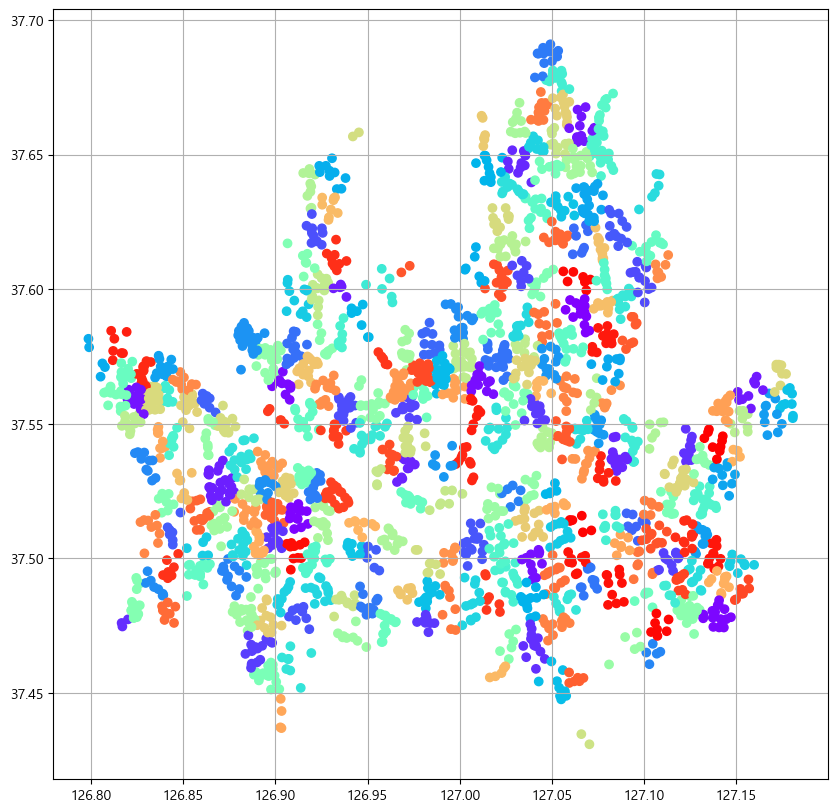

In [16]:
# 클러스터 결과 확인
plt.figure(figsize=(10, 10))

plt.scatter(station_df['stationLongitude'],
            station_df['stationLatitude'],
            c=station_df['cluster'],
            cmap='rainbow')

plt.grid(True)
plt.show()

In [17]:
# office_df와 합치기
merged_data = pd.merge(office_df,
                       station_df,
                       left_on='대여소명',
                       right_on='stationName',
                       how='inner')
merged_data.head()

,자치구,대여소명,기준년월,대여건수,반납건수,rackTotCnt,stationName,parkingBikeTotCnt,shared,stationLatitude,stationLongitude,stationId,cluster
0,강남구,2301. 현대고등학교 건너편,202301,383,439,10,2301. 현대고등학교 건너편,16,160,37.524071,127.021790,ST-777,138
1,강남구,2302. 교보타워 버스정류장(신논현역 3번출구 후면),202301,433,446,10,2302. 교보타워 버스정류장(신논현역 3번출구 후면),1,10,37.505581,127.024277,ST-787,103
2,강남구,2303. 논현역 10번출구,202301,648,508,15,2303. 논현역 10번출구,3,20,37.511372,127.021461,ST-788,103
3,강남구,2304. 대현그린타워,202301,76,55,10,2304. 대현그린타워,2,20,37.511627,127.035652,ST-789,176
4,강남구,2305. MCM 본사 직영점 앞,202301,172,179,6,2305. MCM 본사 직영점 앞,18,300,37.520641,127.034508,ST-790,134


In [18]:
# 거치대, 대여소 대비 대여율, 반납율 구하기
cluster_summary = merged_data.groupby('cluster').agg({
    'rackTotCnt': 'sum',
    '대여건수': 'sum',
    '반납건수': 'sum',
    '대여소명': pd.Series.nunique
})

cluster_summary['거치대 대비 대여율'] = cluster_summary['대여건수'] / cluster_summary['rackTotCnt']
cluster_summary['거치대 대비 반납율'] = cluster_summary['반납건수'] / cluster_summary['rackTotCnt']

cluster_summary['대여소 대비 대여율'] = cluster_summary['대여건수'] / cluster_summary['대여소명']
cluster_summary['대여소 대비 반납율'] = cluster_summary['반납건수'] / cluster_summary['대여소명']
cluster_summary.head()

,rackTotCnt,대여건수,반납건수,대여소명,거치대 대비 대여율,거치대 대비 반납율,대여소 대비 대여율,대여소 대비 반납율
cluster,,,,,,,,
0,920,104346,104049,12,113.419565,113.096739,8695.500000,8670.750000
1,746,122864,122993,12,164.697051,164.869973,10238.666667,10249.416667
2,798,64725,63212,13,81.109023,79.213033,4978.846154,4862.461538
3,840,115082,114621,10,137.002381,136.453571,11508.200000,11462.100000
4,1236,130654,127866,13,105.707120,103.451456,10050.307692,9835.846154


In [19]:
cluster_summary.sort_values('거치대 대비 대여율', ascending=False).head()

,rackTotCnt,대여건수,반납건수,대여소명,거치대 대비 대여율,거치대 대비 반납율,대여소 대비 대여율,대여소 대비 반납율
cluster,,,,,,,,
95,450,142331,141585,7,316.291111,314.633333,20333.000000,20226.428571
201,306,86411,85888,6,282.388889,280.679739,14401.833333,14314.666667
222,798,221886,224499,11,278.052632,281.327068,20171.454545,20409.000000
230,324,89421,94476,4,275.990741,291.592593,22355.250000,23619.000000
79,612,165595,166200,10,270.580065,271.568627,16559.500000,16620.000000


In [20]:
cluster_summary.sort_values('거치대 대비 반납율', ascending=False).head()

,rackTotCnt,대여건수,반납건수,대여소명,거치대 대비 대여율,거치대 대비 반납율,대여소 대비 대여율,대여소 대비 반납율
cluster,,,,,,,,
95,450,142331,141585,7,316.291111,314.633333,20333.000000,20226.428571
230,324,89421,94476,4,275.990741,291.592593,22355.250000,23619.000000
222,798,221886,224499,11,278.052632,281.327068,20171.454545,20409.000000
201,306,86411,85888,6,282.388889,280.679739,14401.833333,14314.666667
79,612,165595,166200,10,270.580065,271.568627,16559.500000,16620.000000


In [21]:
# 거치대 대비 대여, 반납율이 모두 높음 (이용률이 높음)
# 거치대 추가 설치 필요
station_df[station_df['cluster'] == 95]

,rackTotCnt,stationName,parkingBikeTotCnt,shared,stationLatitude,stationLongitude,stationId,cluster
717,10,1117. 등촌5단지아파트 버스정류장,5,50,37.558197,126.844261,ST-834,95
722,6,1124. 발산역 6번 출구 뒤,3,50,37.558178,126.838455,ST-522,95
751,20,1166. 강서구립등빛도서관,5,25,37.562569,126.842461,ST-1351,95
1642,12,2721.등촌1-10단지 교차로,16,133,37.563206,126.839363,ST-2037,95
1922,10,3764. 관문주유소(GS칼택스) 앞,0,0,37.558029,126.841835,ST-2613,95
2561,10,5084. 강서우체국,8,80,37.564182,126.840279,ST-3100,95
2568,14,5095. 원당근린공원,0,0,37.559475,126.841476,ST-3226,95


In [22]:
cluster_summary.sort_values('대여소 대비 대여율', ascending=False).head()

,rackTotCnt,대여건수,반납건수,대여소명,거치대 대비 대여율,거치대 대비 반납율,대여소 대비 대여율,대여소 대비 반납율
cluster,,,,,,,,
236,1464,269080,269994,10,183.797814,184.422131,26908.000000,26999.400000
230,324,89421,94476,4,275.990741,291.592593,22355.250000,23619.000000
33,702,187245,184571,9,266.730769,262.921652,20805.000000,20507.888889
95,450,142331,141585,7,316.291111,314.633333,20333.000000,20226.428571
222,798,221886,224499,11,278.052632,281.327068,20171.454545,20409.000000


In [23]:
cluster_summary.sort_values('대여소 대비 반납율', ascending=False).head()

,rackTotCnt,대여건수,반납건수,대여소명,거치대 대비 대여율,거치대 대비 반납율,대여소 대비 대여율,대여소 대비 반납율
cluster,,,,,,,,
236,1464,269080,269994,10,183.797814,184.422131,26908.000000,26999.400000
230,324,89421,94476,4,275.990741,291.592593,22355.250000,23619.000000
33,702,187245,184571,9,266.730769,262.921652,20805.000000,20507.888889
222,798,221886,224499,11,278.052632,281.327068,20171.454545,20409.000000
172,882,218895,222861,11,248.180272,252.676871,19899.545455,20260.090909


In [24]:
# 대여소 대비 대여, 반납율 모두 높음 (이용률 높음)
# 대여소 추가 설치 필요 
station_df[station_df['cluster'] == 236]

,rackTotCnt,stationName,parkingBikeTotCnt,shared,stationLatitude,stationLongitude,stationId,cluster
715,15,1112. 마곡엠밸리4단지 정문,22,147,37.568577,126.824776,ST-513,236
771,8,1188. 롯데중앙연구소,41,513,37.571381,126.828339,ST-1708,236
1624,26,2701. 마곡나루역 5번출구 뒤편,37,142,37.565201,126.827316,ST-1718,236
1636,25,2715.마곡나루역 2번 출구,15,60,37.566925,126.827438,ST-2031,236
1637,20,2716.롯데 R&D 센터,83,415,37.570942,126.828316,ST-2032,236
1646,25,2727.서울식물원 잔디마당 앞,134,536,37.563927,126.830643,ST-2044,236
1647,65,2728.마곡나루역 3번 출구,48,74,37.565804,126.828079,ST-2045,236
1648,30,2729.넥센 유니버시티 앞,79,263,37.569485,126.828094,ST-2046,236
1655,20,2740.마곡레포츠센터,10,50,37.572975,126.832443,ST-2057,236
2566,10,5090. 대상연구소,62,620,37.569809,126.828575,ST-3137,236


### **고장 예측**

In [25]:
break_df['등록일시'] = pd.to_datetime(break_df['등록일시'])
history_df['대여일시'] = pd.to_datetime(history_df['대여일시'])

In [ ]:
# 2023년 1월 데이터만 가져오기
jan_break_df = break_df[
    (break_df['등록일시'] >= '2023-01-01') &
    (break_df['등록일시'] < '2023-02-01')
]
jan_break_df.head()

,자전거번호,등록일시,구분
0,SPB-62819,2023-01-01 00:01:00,안장
1,SPB-62819,2023-01-01 00:01:00,페달
2,SPB-32382,2023-01-01 00:24:00,타이어
3,SPB-81126,2023-01-01 01:20:00,단말기
4,SPB-45763,2023-01-01 01:49:00,체인


In [ ]:
# 1. 자전거번호 별로 고장기록 하나씩만 남김
# 2. left merge로 대여기록은 모두 남고 등록기록은 없는 경우 NaN
# 3. 대여일시가 고장 발생 2일 전부터 고장 발생 직전까지의 구간 break_soon = True
# 4. 현재 루프에서 처리한 자전거 고장 기록 제거하고 하나도 남지 않을때까지 반복
import datetime

history_df['break_soon'] = False

copied_jan_break_df = jan_break_df.copy()
while len(copied_jan_break_df) != 0:
    unique_copied_jan_break_df = copied_jan_break_df.drop_duplicates('자전거번호')
    merged_df = history_df.merge(unique_copied_jan_break_df[['자전거번호', '등록일시']],
                                 on='자전거번호',
                                 how='left')
    
    merged_df['break_soon'] = (
        (merged_df['대여일시'] > merged_df['등록일시'] - datetime.timedelta(days=2)) &
        (merged_df['대여일시'] < merged_df['등록일시'])
    )

    history_df.loc[merged_df['break_soon'], 'break_soon'] = True
    copied_jan_break_df.drop(index=unique_copied_jan_break_df.index, inplace=True)

In [34]:
sum(history_df['break_soon'])

55747

In [37]:
history_df[history_df['break_soon']].head()

,자전거번호,대여일시,대여 대여소번호,대여 대여소명,대여거치대,반납일시,반납대여소번호,반납대여소명,반납거치대,이용시간(분),이용거리(M),생년,성별,이용자종류,대여대여소ID,반납대여소ID,대여시간,반납시간,break_soon
0,SPB-39194,2023-01-01 00:02:13,1554,번동사거리,0,2023-01-01 00:02:43,1554.0,번동사거리,0,0,0.0,1977,\N,내국인,ST-2127,ST-2127,0,0,True
47,SPB-53361,2023-01-01 00:09:41,1630,수연빌딩 앞,0,2023-01-01 00:10:22,1630.0,수연빌딩 앞,0,0,0.0,2001,\N,내국인,ST-869,ST-869,0,0,True
92,SPB-33396,2023-01-01 00:13:19,328,탑골공원 앞,0,2023-01-01 00:13:59,328.0,탑골공원 앞,0,0,0.0,1988,M,내국인,ST-144,ST-144,0,0,True
168,SPB-53550,2023-01-01 00:18:46,1185,등촌9단지,0,2023-01-01 00:18:54,1185.0,등촌9단지,0,0,0.0,1996,\N,내국인,ST-1646,ST-1646,0,0,True
241,SPB-59141,2023-01-01 00:18:01,1149,신방화역환승주차장,0,2023-01-01 00:23:20,1162.0,공항초등학교건너편,0,5,630.0,2002,\N,내국인,ST-975,ST-1253,0,0,True


In [40]:
# 고장 예정인 자전거와 아닌 자전거의 이용시간
print(history_df[history_df['break_soon']]['이용시간(분)'].mean())
print(history_df[~history_df['break_soon']]['이용시간(분)'].mean())

14.473101691570847
17.70024730211558


In [ ]:
# 고장 예정인 자전거와 아닌 자전거의 0분 이용비율
# 고장 예정인 자전거의 0분 이용비율이 아닌 자전거에 비해 높음
print(sum((history_df['break_soon']) & (history_df['이용시간(분)'] == 0)) / sum(history_df['break_soon']))
print(sum((~history_df['break_soon']) & (history_df['이용시간(분)'] == 0)) / sum(~history_df['break_soon']))

0.10596085888029849
0.03255627594789122


In [ ]:
# 위 작업을 고장 발생 n일 전부터 고장 발생 직전까지
# 자전거 평균 이용시간, 0분 이용비율 출력
# 시간이 흐를수록 고장 예정 자전거 이용시간이 점점 늘어나는 것을 볼 수 있음
# 반면에 시간이 흐를수록 고장 예정 자전거의 0분 이용비율은 감소하는 것을 볼 수 있음
for days in range(1, 10):
    history_df['break_soon'] = False

    copied_jan_break_df = jan_break_df.copy()
    while len(copied_jan_break_df) != 0:
        unique_copied_jan_break_df = copied_jan_break_df.drop_duplicates('자전거번호')
        merged_df = history_df.merge(unique_copied_jan_break_df[['자전거번호', '등록일시']], on='자전거번호', how='left')

        merged_df['break_soon'] = (
            (merged_df['대여일시'] > merged_df['등록일시'] - datetime.timedelta(days=days)) &
            (merged_df['대여일시'] < merged_df['등록일시'])
        )

        history_df.loc[merged_df['break_soon'], 'break_soon'] = True
        copied_jan_break_df.drop(index=unique_copied_jan_break_df.index, inplace=True)

    mean_break_soon = history_df[history_df['break_soon']]['이용시간(분)'].mean()
    mean_not_break_soon = history_df[~history_df['break_soon']]['이용시간(분)'].mean()
    
    zero_min_break_soon = sum((history_df['break_soon']) & (history_df['이용시간(분)'] == 0)) / sum(history_df['break_soon'])
    zero_min_not_break_soon = sum((~history_df['break_soon']) & (history_df['이용시간(분)'] == 0)) / sum(~history_df['break_soon'])
    
    print(f'{days}일 이전 / 고장 예정 자전거 이용시간 : {mean_break_soon},\
    그 외 자전거 이용시간 : {mean_not_break_soon}')
          
    print(f'{days}일 이전 / 고장 예정 0분 이용 비율 : {zero_min_break_soon},\
    그 외 0분 이용 비율 : {zero_min_not_break_soon}')
          
    print('------------------------------------------------------------------------------------------------')

1일 이전 / 고장 예정 자전거 이용시간 : 13.423996044608032,    그 외 자전거 이용시간 : 17.685100582169724
1일 이전 / 고장 예정 0분 이용 비율 : 0.1251716749986266,    그 외 0분 이용 비율 : 0.03300670964675867
------------------------------------------------------------------------------------------------
2일 이전 / 고장 예정 자전거 이용시간 : 14.473101691570847,    그 외 자전거 이용시간 : 17.70024730211558
2일 이전 / 고장 예정 0분 이용 비율 : 0.10596085888029849,    그 외 0분 이용 비율 : 0.03255627594789122
------------------------------------------------------------------------------------------------
3일 이전 / 고장 예정 자전거 이용시간 : 14.957987421383647,    그 외 자전거 이용시간 : 17.710672192505847
3일 이전 / 고장 예정 0분 이용 비율 : 0.09438155136268343,    그 외 0분 이용 비율 : 0.03234431723875129
------------------------------------------------------------------------------------------------
4일 이전 / 고장 예정 자전거 이용시간 : 15.322323620697642,    그 외 자전거 이용시간 : 17.71665866278349
4일 이전 / 고장 예정 0분 이용 비율 : 0.08649881873349702,    그 외 0분 이용 비율 : 0.03219110174742843
------------------------------------------------

In [ ]:
# 고장 발생 n일 전부터 n - 1일 전까지
# 자전거 평균 이용시간, 0분 이용비율 출력
# 마찬가지로 시간이 흐를수록 고장 예정 자전거 이용시간이 점점 늘어나는 것을 볼 수 있고,
# 반면에 시간이 흐를수록 고장 예정 자전거의 0분 이용비율은 감소하는 것을 볼 수 있음
for days in range(1, 10) : 
    history_df['break_soon'] = False

    copied_jan_break_df = jan_break_df.copy()
    while len(copied_jan_break_df) != 0 :
        unique_copied_jan_break_df = copied_jan_break_df.drop_duplicates('자전거번호')
        merged_df = history_df.merge(unique_copied_jan_break_df[['자전거번호', '등록일시']], on='자전거번호', how='left')

        merged_df['break_soon'] = (
            (merged_df['대여일시'] > merged_df['등록일시'] - datetime.timedelta(days=days)) & 
            (merged_df['대여일시'] < merged_df['등록일시'] - datetime.timedelta(days=days-1)) 
            )

        history_df.loc[merged_df['break_soon'], "break_soon"] = True
        copied_jan_break_df.drop(index=unique_copied_jan_break_df.index, inplace=True)
        
    mean_break_soon = history_df[history_df['break_soon']]['이용시간(분)'].mean()
    mean_not_break_soon = history_df[~history_df['break_soon']]['이용시간(분)'].mean()
    
    zero_min_break_soon = sum((history_df['break_soon']) & (history_df['이용시간(분)'] == 0)) / sum(history_df['break_soon'])
    zero_min_not_break_soon = sum((~history_df['break_soon']) & (history_df['이용시간(분)'] == 0)) / sum(~history_df['break_soon'])
    
    print(f'{days}일 이전 / 고장 예정 자전거 이용시간 : {round(mean_break_soon, 3)},\
    그 외 자전거 이용시간 : {round(mean_not_break_soon, 3)}')
          
    print(f'{days}일 이전 / 고장 예정 0분 이용 비율 : {round(zero_min_break_soon, 3)},\
    그 외 0분 이용 비율 : {round(zero_min_not_break_soon, 3)}')
          
    print('------------------------------------------------------------------------------------------------')

1일 이전 / 고장 예정 자전거 이용시간 : 13.424,    그 외 자전거 이용시간 : 17.685
1일 이전 / 고장 예정 0분 이용 비율 : 0.125,    그 외 0분 이용 비율 : 0.033
------------------------------------------------------------------------------------------------
2일 이전 / 고장 예정 자전거 이용시간 : 16.333,    그 외 자전거 이용시간 : 17.606
2일 이전 / 고장 예정 0분 이용 비율 : 0.072,    그 외 0분 이용 비율 : 0.035
------------------------------------------------------------------------------------------------
3일 이전 / 고장 예정 자전거 이용시간 : 16.481,    그 외 자전거 이용시간 : 17.602
3일 이전 / 고장 예정 0분 이용 비율 : 0.058,    그 외 0분 이용 비율 : 0.035
------------------------------------------------------------------------------------------------
4일 이전 / 고장 예정 자전거 이용시간 : 17.128,    그 외 자전거 이용시간 : 17.595
4일 이전 / 고장 예정 0분 이용 비율 : 0.05,    그 외 0분 이용 비율 : 0.035
------------------------------------------------------------------------------------------------
5일 이전 / 고장 예정 자전거 이용시간 : 17.437,    그 외 자전거 이용시간 : 17.592
5일 이전 / 고장 예정 0분 이용 비율 : 0.041,    그 외 0분 이용 비율 : 0.035
-------------------------------------------

## **marketing**

In [44]:
# 새로 데이터 불러오기 + 기본 전처리
station_df = pd.read_csv('./station_data.csv', index_col=0)
break_df = pd.read_csv('./서울시 공공자전거 고장신고 내역_23.1-6.csv', encoding="cp949")
office_df = pd.read_csv('./서울특별시 공공자전거 대여소별 이용정보(월별)_23.1-6.csv', encoding="cp949")
history_df = pd.read_csv('./서울특별시 공공자전거 대여이력 정보_2301.csv', encoding="cp949")

history_df['반납대여소번호'] = history_df['반납대여소번호'].replace("\\N", np.nan)
history_df['반납대여소번호'] = history_df['반납대여소번호'].astype(float)

office_df['대여건수'] = office_df['대여건수'].str.replace(",", "").astype(int)
office_df['반납건수'] = office_df['반납건수'].str.replace(",", "").replace(' - ', 0).astype(int)

### **타겟 광고를 위한 데이터 분석**

- 20대 남성

In [45]:
history_df['성별'] = history_df['성별'].replace({'m': 'M', 'f': 'F', np.nan: '\\N'})

In [46]:
history_df['생년'] = history_df['생년'].replace('\\N', np.nan)
history_df['생년'] = history_df['생년'].astype(float)

In [50]:
# 현재 시점을 기준으로 연령과 연령대 컬럼 추가
current_year = datetime.datetime.now().year

filtered_history_df = history_df.copy()
filtered_history_df = filtered_history_df[(filtered_history_df['생년'] > 0) &
                                          (filtered_history_df['생년'] <= 2010)]

filtered_history_df['연령'] = current_year - filtered_history_df['생년']

age_bins = [13, 20, 30, 40, 50, 60, 70, 80, 90, 100]
age_labels = ['13-19', '20-29', '30-39', '40-49', '50-59', '60-69', '70-79', '80-89', '90+']

filtered_history_df['연령대'] = pd.cut(filtered_history_df['연령'],
                                    bins=age_bins,
                                    labels=age_labels)

In [51]:
# 20대 남성이 자주 사용하는 대여소
target_df = filtered_history_df[
    (filtered_history_df['성별'] == 'M') &
    (filtered_history_df['연령대'] == '20-29')
]
target_df.head()

,자전거번호,대여일시,대여 대여소번호,대여 대여소명,대여거치대,반납일시,반납대여소번호,반납대여소명,반납거치대,이용시간(분),이용거리(M),생년,성별,이용자종류,대여대여소ID,반납대여소ID,연령,연령대
5,SPB-35099,2023-01-01 00:01:24,2038,동작역 7번출구,0,2023-01-01 00:05:37,4178.0,이수성결교회 옆,0,4,1005.05,2003.0,M,내국인,ST-696,ST-3065,22.0,20-29
10,SPB-64954,2023-01-01 00:05:49,2703,서울도시가스 앞,0,2023-01-01 00:06:26,2703.0,서울도시가스 앞,0,1,0.00,2004.0,M,내국인,ST-2018,ST-2018,21.0,20-29
15,SPB-33542,2023-01-01 00:04:20,1986,태평양물산빌딩,0,2023-01-01 00:07:03,1955.0,디지털입구 교차로,0,2,551.83,1997.0,M,내국인,ST-1521,ST-936,28.0,20-29
19,SPB-42593,2023-01-01 00:06:59,2703,서울도시가스 앞,0,2023-01-01 00:07:46,2703.0,서울도시가스 앞,0,1,0.00,2004.0,M,내국인,ST-2018,ST-2018,21.0,20-29
26,SPB-34618,2023-01-01 00:00:27,2655,송이공원,0,2023-01-01 00:09:00,2620.0,송파나루역 4번 출구옆,0,8,1345.14,2000.0,M,내국인,ST-1876,ST-1730,25.0,20-29


In [ ]:
# 대여 대여소별 대여횟수 Top 10
target_station_counts = target_df.groupby('대여 대여소명').size().reset_index(name='대여횟수')
target_station_counts.sort_values('대여횟수', ascending=False).head(10)

,대여 대여소명,대여횟수
1775,안암로터리 버스정류장 앞,584
1946,오목교역 3번출구,548
1649,신대방역 2번 출구,517
1043,"발산역 1번, 9번 인근 대여소",502
1122,봉림교 교통섬,500
841,마곡나루역 2번 출구,480
1330,서울과학기술대학교(어학교육원),441
809,롯데월드타워(잠실역2번출구 쪽),425
354,구로디지털단지역 앞,418
229,건대병원후문,418


In [55]:
# 대여 대여소별 전체대여횟수
total_rentals_per_station = filtered_history_df.groupby('대여 대여소명').size().reset_index(name='전체대여횟수')
total_rentals_per_station.head(10)

,대여 대여소명,전체대여횟수
0,(시립)고덕평생학습관,273
1,(재)FITI시험연구원,1026
2,3호선 매봉역 3번출구앞,710
3,419민주묘지 입구사거리,351
4,419민주묘지역,243
5,419민주묘지역 1번출구,268
6,419탑 앞,236
7,500번·507번 버스 종점 앞,55
8,63스퀘어,960
9,7번가피자 서교망원점,1105


In [56]:
merged_df = total_rentals_per_station.merge(target_station_counts,
                                            on='대여 대여소명',
                                            how='left')
merged_df.head()

,대여 대여소명,전체대여횟수,대여횟수
0,(시립)고덕평생학습관,273,19.0
1,(재)FITI시험연구원,1026,67.0
2,3호선 매봉역 3번출구앞,710,65.0
3,419민주묘지 입구사거리,351,44.0
4,419민주묘지역,243,32.0


In [ ]:
# 전체대여횟수중 20대 남성의 대여 횟수 비율 Top 10
merged_df['20대남성비율'] = merged_df['대여횟수'] / merged_df['전체대여횟수']
merged_df.sort_values('20대남성비율', ascending=False).head(10)

,대여 대여소명,전체대여횟수,대여횟수,20대남성비율
371,구룡역 4번 출구,41,22.0,0.536585
1546,세종대학교(학술정보원),114,59.0,0.517544
1630,시흥4동주민센터 앞,90,44.0,0.488889
1022,문화비축기지,67,32.0,0.477612
1543,세종대학교,84,38.0,0.452381
1340,서울과학기술대학교(어학교육원),977,441.0,0.451382
1394,서울시립대 앞,85,37.0,0.435294
1339,서울과학기술대학교(미래관),170,71.0,0.417647
984,목양전원교회 앞 로터리,99,40.0,0.404040
484,낙성대 교수아파트,143,56.0,0.391608


In [ ]:
# 전체 대여 중 20대 남성의 대여는 약 11.6% 차지
total_rentals = len(filtered_history_df)
target_rentals = len(target_df)

target_rentals / total_rentals

0.11157015788024295

### **KMeans를 활용한 비슷한 성향의 대여소 찾기**
- 서울과학기술대학교(어학교육원)과 비슷한 성향의 대여소 찾기

In [59]:
filtered_history_df['대여시간'] = pd.to_datetime(filtered_history_df['대여일시']).dt.hour

In [ ]:
# 각 대여소마다 대여시간대별 대여횟수
hourly_groupby_df = filtered_history_df.groupby(['대여 대여소명', '대여시간']).size().unstack(fill_value=0)
hourly_groupby_df.head()

대여시간,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
대여 대여소명,,,,,,,,,,,,,,,,,,,,,
(시립)고덕평생학습관,1,2,2,4,1,0,0,14,3,11,...,16,12,21,12,28,14,22,21,7,1
(재)FITI시험연구원,13,8,1,2,0,1,9,85,195,71,...,22,37,96,53,143,37,39,20,10,16
3호선 매봉역 3번출구앞,18,3,3,3,0,5,18,13,104,57,...,43,28,36,48,88,45,23,35,32,17
419민주묘지 입구사거리,16,10,4,7,5,6,12,27,5,41,...,19,13,24,11,19,10,13,21,8,6
419민주묘지역,7,9,1,1,0,1,2,4,9,13,...,15,13,12,16,19,16,8,9,8,11


In [ ]:
# 각 대여소마다 연령대별 대여횟수
age_groupby_df = filtered_history_df.groupby(['대여 대여소명', '연령대']).size().unstack(fill_value=0)
age_groupby_df.head()

연령대,13-19,20-29,30-39,40-49,50-59,60-69,70-79,80-89,90+
대여 대여소명,,,,,,,,,
(시립)고덕평생학습관,13,69,60,51,55,23,1,0,0
(재)FITI시험연구원,0,188,656,85,68,27,0,0,0
3호선 매봉역 3번출구앞,6,138,247,143,114,48,12,1,0
419민주묘지 입구사거리,5,72,74,38,46,116,0,0,0
419민주묘지역,6,64,63,30,29,44,7,0,0


In [ ]:
# 각 대여소마다 성별별 대여횟수
gender_groupby_df = filtered_history_df.groupby(['대여 대여소명', '성별']).size().unstack(fill_value=0)
gender_groupby_df.head()

성별,F,M,\N
대여 대여소명,,,
(시립)고덕평생학습관,78,122,73
(재)FITI시험연구원,239,423,364
3호선 매봉역 3번출구앞,136,373,201
419민주묘지 입구사거리,66,209,76
419민주묘지역,50,145,48


In [ ]:
# 종합
general_groupby_df = filtered_history_df.groupby(['대여 대여소명', '성별', '연령대', '대여시간']).size()
general_groupby_df = general_groupby_df.unstack('성별')
general_groupby_df = general_groupby_df.unstack('연령대')
general_groupby_df = general_groupby_df.unstack('대여시간')
general_groupby_df.head()

성별                F                             ...  \N                       \
연령대           13-19                             ... 90+                        
대여시간             0  1  2  3  4  5  6  7  8  9   ...  14 15 16 17 18 19 20 21   
대여 대여소명                                         ...                            
(시립)고덕평생학습관       0  0  0  0  0  0  0  0  0  0  ...   0  0  0  0  0  0  0  0   
(재)FITI시험연구원      0  0  0  0  0  0  0  0  0  0  ...   0  0  0  0  0  0  0  0   
3호선 매봉역 3번출구앞     0  0  0  0  0  0  0  0  0  0  ...   0  0  0  0  0  0  0  0   
419민주묘지 입구사거리     0  0  0  0  0  0  0  0  0  0  ...   0  0  0  0  0  0  0  0   
419민주묘지역          1  0  0  0  0  0  0  0  0  0  ...   0  0  0  0  0  0  0  0   

성별                   
연령대                  
대여시간          22 23  
대여 대여소명              
(시립)고덕평생학습관    0  0  
(재)FITI시험연구원   0  0  
3호선 매봉역 3번출구앞  0  0  
419민주묘지 입구사거리  0  0  
419민주묘지역       0  0  

[5 rows x 648 columns]

In [ ]:
# 모두 합치기
features_df = pd.concat(
    [general_groupby_df, gender_groupby_df, age_groupby_df, hourly_groupby_df],
    axis=1
)
features_df.head()

,"(F, 13-19, 0)","(F, 13-19, 1)","(F, 13-19, 2)","(F, 13-19, 3)","(F, 13-19, 4)","(F, 13-19, 5)","(F, 13-19, 6)","(F, 13-19, 7)","(F, 13-19, 8)","(F, 13-19, 9)",...,14,15,16,17,18,19,20,21,22,23
대여 대여소명,,,,,,,,,,,,,,,,,,,,,
(시립)고덕평생학습관,0,0,0,0,0,0,0,0,0,0,...,16,12,21,12,28,14,22,21,7,1
(재)FITI시험연구원,0,0,0,0,0,0,0,0,0,0,...,22,37,96,53,143,37,39,20,10,16
3호선 매봉역 3번출구앞,0,0,0,0,0,0,0,0,0,0,...,43,28,36,48,88,45,23,35,32,17
419민주묘지 입구사거리,0,0,0,0,0,0,0,0,0,0,...,19,13,24,11,19,10,13,21,8,6
419민주묘지역,1,0,0,0,0,0,0,0,0,0,...,15,13,12,16,19,16,8,9,8,11


In [67]:
features_df.columns = features_df.columns.astype(str)

In [ ]:
# KMeans를 통한 clustering
kmeans = KMeans(n_clusters=30, random_state=13)
features_df['cluster'] = kmeans.fit_predict(features_df)
features_df.head()

,"('F', '13-19', 0)","('F', '13-19', 1)","('F', '13-19', 2)","('F', '13-19', 3)","('F', '13-19', 4)","('F', '13-19', 5)","('F', '13-19', 6)","('F', '13-19', 7)","('F', '13-19', 8)","('F', '13-19', 9)",...,15,16,17,18,19,20,21,22,23,cluster
대여 대여소명,,,,,,,,,,,,,,,,,,,,,
(시립)고덕평생학습관,0,0,0,0,0,0,0,0,0,0,...,12,21,12,28,14,22,21,7,1,11
(재)FITI시험연구원,0,0,0,0,0,0,0,0,0,0,...,37,96,53,143,37,39,20,10,16,29
3호선 매봉역 3번출구앞,0,0,0,0,0,0,0,0,0,0,...,28,36,48,88,45,23,35,32,17,27
419민주묘지 입구사거리,0,0,0,0,0,0,0,0,0,0,...,13,24,11,19,10,13,21,8,6,11
419민주묘지역,1,0,0,0,0,0,0,0,0,0,...,13,12,16,19,16,8,9,8,11,11


In [ ]:
# 서울과학기술대학교(어학교육원)과 비슷한 성향의 대여소 목록
target_cluster = features_df.loc['서울과학기술대학교(어학교육원)']['cluster']
features_df[features_df['cluster'] == target_cluster].index

Index(['건국대학교 학생회관', '과기대 입구(우)', '광운대역 앞', '동신아파트 후문 옆', '동해문화예술관앞',
       '둔촌동역교차로', '맥도날드 서울둔촌DT점 앞', '목동사거리 부근', '미아사거리 1번 출구', '보문4교 인근',
       '사근빗물펌프장 건너편', '상계주공1단지 버스정류장 옆(대원빌딩 앞)', '상계주공2단지 버스정류장 옆',
       '상계초교 입구 교차로 명주빌딩 앞', '서울과학기술대학교(어학교육원)', '서울시립대 정문 앞', '성균관대 정문',
       '신사로입구', '신설동역 11번출구 뒤', '어린이대공원역 3번출구 앞', '온곡초교 교차로', '외국어대 정문 앞',
       '용두동 사거리', '원일교회', '중랑전화국 교차로', '중앙하이츠 아파트 입구', '홍대입구역 8번출구 앞',
       '홍익병원앞 교차로', '화곡역 버스정류장', '화양동 우체국'],
      dtype='object', name='대여 대여소명')

In [ ]:
# 서울과학기술대학교(어학교육원)과 비슷한 성향의 대여소 개수
len(features_df[features_df['cluster'] == target_cluster].index)

30